# Predicting AirBnB Accomodation Prices in Prague

## Main Research Questions

### Q1: How accurately can geospatial machine learning models predict the AirBnB property prices of the city Prague?

### Q2: Which features, including geospatial factors, have the most significant impact on predicted AirBnB property prices in Prague?


# PART 1: Data Loading and Exploratory Data Analysis

In [154]:
import pandas as pd
import numpy as np
import geopandas as gpd
import geodatasets as gds

import matplotlib.pyplot as plt 
import seaborn as sns
import contextily as cx
import mapclassify as mc
import folium as fm
import seaborn as sns
import matplotlib as mpl
import osmnx as ox

## 1.1 Load files into the notebook

In [155]:
# Load the geodataframe

# Saving the path to the file into a filepath variable
filepath_geojson = 'Datensatz/neighbourhoods.geojson'

# Loading the filepath variable into a Geodataframe
gdf_neighbourhoods = gpd.read_file(filepath_geojson)

# Load the listings

# Saving the path to the file into a filepath variable
filepath_listings = 'Datensatz/listings.csv.gz'

# Loading the filepath variable into a Geodataframe
df_listings = pd.read_csv(filepath_listings)

## 1.2 Data Cleaning

### 1.2.1 The gdf_neighbourhoods dataset

In [156]:
gdf_neighbourhoods.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 57 entries, 0 to 56
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   neighbourhood        57 non-null     object  
 1   neighbourhood_group  0 non-null      object  
 2   geometry             57 non-null     geometry
dtypes: geometry(1), object(2)
memory usage: 1.5+ KB


In [157]:
gdf_neighbourhoods.head()

,neighbourhood,neighbourhood_group,geometry
0,Praha 1,None,"MULTIPOLYGON (((14.41089 50.07867, 14.40982 50..."
1,Praha 6,None,"MULTIPOLYGON (((14.29320 50.07751, 14.29317 50..."
2,Praha 9,None,"MULTIPOLYGON (((14.47848 50.09771, 14.47924 50..."
3,Suchdol,None,"MULTIPOLYGON (((14.38913 50.12446, 14.38866 50..."
4,Ďáblice,None,"MULTIPOLYGON (((14.45642 50.13702, 14.45642 50..."


In [158]:
# Remove the column neighbourhood_group because it is empty

# Check if 'neighbourhood_group' column exists
if 'neighbourhood_group' in gdf_neighbourhoods.columns:
    # Drop the 'neighbourhood_group' column
    gdf_neighbourhoods.drop(columns=['neighbourhood_group'], inplace=True)
    print("Column 'neighbourhood_group' removed successfully.")
else:
    print("Column 'neighbourhood_group' does not exist.")

gdf_neighbourhoods.head()


Column 'neighbourhood_group' removed successfully.


,neighbourhood,geometry
0,Praha 1,"MULTIPOLYGON (((14.41089 50.07867, 14.40982 50..."
1,Praha 6,"MULTIPOLYGON (((14.29320 50.07751, 14.29317 50..."
2,Praha 9,"MULTIPOLYGON (((14.47848 50.09771, 14.47924 50..."
3,Suchdol,"MULTIPOLYGON (((14.38913 50.12446, 14.38866 50..."
4,Ďáblice,"MULTIPOLYGON (((14.45642 50.13702, 14.45642 50..."


- Here we see the different neighborhoods of Prague in the map

### 1.2.2 The listings dataset

In [159]:
df_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8366 entries, 0 to 8365
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            8366 non-null   int64  
 1   listing_url                                   8366 non-null   object 
 2   scrape_id                                     8366 non-null   int64  
 3   last_scraped                                  8366 non-null   object 
 4   source                                        8366 non-null   object 
 5   name                                          8366 non-null   object 
 6   description                                   8151 non-null   object 
 7   neighborhood_overview                         4484 non-null   object 
 8   picture_url                                   8366 non-null   object 
 9   host_id                                       8366 non-null   i

In [160]:
df_listings.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,23163,https://www.airbnb.com/rooms/23163,20240325142220,2024-03-25,city scrape,Residence Karolina - KAROL12,"Unique and elegant apartment rental in Prague,...",NaN,https://a0.muscache.com/pictures/01bbe32c-3f13...,5282,...,4.96,4.93,4.86,NaN,t,70,69,0,0,0.18
1,23169,https://www.airbnb.com/rooms/23169,20240325142220,2024-03-25,city scrape,Residence Masna - Masna302,Masna studio offers a lot of space and privacy...,NaN,https://a0.muscache.com/pictures/b450cf2a-8561...,5282,...,4.86,4.97,4.69,NaN,t,70,69,0,0,0.69
2,26755,https://www.airbnb.com/rooms/26755,20240325142220,2024-03-25,city scrape,Central Prague Old Town Top Floor,Big and beautiful new attic apartment in the v...,This apartment offers a fantastic location. Yo...,https://a0.muscache.com/pictures/miso/Hosting-...,113902,...,4.96,4.93,4.89,NaN,f,3,3,0,0,3.32
3,30762,https://www.airbnb.com/rooms/30762,20240325142220,2024-03-25,city scrape,Residence Rybna - Rybna23,"We offer a modern, comfortable, serviced apart...",NaN,https://a0.muscache.com/pictures/dfbb2fc2-91a0...,5282,...,4.69,4.94,4.50,NaN,t,70,69,0,0,0.10
4,42514,https://www.airbnb.com/rooms/42514,20240325142220,2024-03-25,city scrape,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old ...",*NEWLY* Furnished 1-bedroom apartment on the f...,NaN,https://a0.muscache.com/pictures/7f66bc43-25c7...,185641,...,4.84,4.90,4.79,NaN,f,1,1,0,0,2.01


In [161]:
# Remove the columns 

# List of columns to remove
columns_to_remove = [
    'listing_url', 'scrape_id', 'last_scraped', 'source', 'name', 'description',
    'picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location',
    'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate',
    'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count',
    'host_total_listings_count', 'host_verifications', 'bathrooms_text',
    'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights',
    'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm',
    'calendar_updated', 'has_availability', 'availability_30', 'availability_60',
    'availability_90', 'availability_365', 'calendar_last_scraped',
    'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review', 'last_review',
    'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin',
    'review_scores_communication', 'review_scores_location', 'license', 'instant_bookable',
    'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes',
    'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms',
    'reviews_per_month', 'host_has_profile_pic', 'neighborhood_overview', 'neighbourhood', 'neighbourhood_group_cleansed', 'review_scores_value', 'amenities',
    "host_is_superhost",	"host_identity_verified"
]

# Remove the specified columns
df_listings.drop(columns=columns_to_remove, inplace=True)

df_listings.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8366 entries, 0 to 8365
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      8366 non-null   int64  
 1   neighbourhood_cleansed  8366 non-null   object 
 2   latitude                8366 non-null   float64
 3   longitude               8366 non-null   float64
 4   property_type           8366 non-null   object 
 5   room_type               8366 non-null   object 
 6   accommodates            8366 non-null   int64  
 7   bathrooms               8043 non-null   float64
 8   bedrooms                8297 non-null   float64
 9   beds                    8026 non-null   float64
 10  price                   8029 non-null   object 
 11  minimum_nights          8366 non-null   int64  
 12  maximum_nights          8366 non-null   int64  
 13  number_of_reviews       8366 non-null   int64  
 14  review_scores_rating    7585 non-null   

In [162]:
df_listings.head()

,id,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating
0,23163,Praha 1,50.08229,14.41552,Entire rental unit,Entire home/apt,4,1.0,1.0,2.0,"$3,955.00",1,365,30,4.90
1,23169,Praha 1,50.08830,14.42272,Entire rental unit,Entire home/apt,3,1.0,1.0,2.0,"$2,955.00",1,365,117,4.73
2,26755,Praha 1,50.08729,14.43179,Entire rental unit,Entire home/apt,4,1.5,1.0,2.0,"$3,223.00",3,700,358,4.94
3,30762,Praha 1,50.08821,14.42623,Entire serviced apartment,Entire home/apt,6,1.0,2.0,3.0,"$6,741.00",1,365,16,4.75
4,42514,Praha 1,50.08228,14.41345,Entire rental unit,Entire home/apt,3,1.0,1.0,2.0,"$2,763.00",7,365,333,4.76


In [163]:
# Konvertiere die Spalte 'price' in numerische Werte
df_listings['price'] = df_listings['price'].str.replace('$', '').str.replace(',', '').astype(float)

# Konvertiere den Preis von Tchechische Krone in Euro (1 CZK = 0.04 EUR)
df_listings['price'] = df_listings['price'] * 0.04

#### Numeric and Categorical Property Features 

##### Numeric Features:
- id
- latitude
- longitude 
- accommodates 
- bathrooms
- bedrooms
- beds
- price  
- minimum_nights 
- maximum_nights 
- number_of_reviews 
- review_scores_rating   

##### Categorical Features:
- host_is_superhost (boolean)
- host_identity_verified 
- neighbourhood_cleansed 
- property_type 
- room_type 
- amenities


- Some of the room and property types are almost not present, therefore I will summarize and remove them for my analysis.

- I will also change them to dummies for my analysis.

In [164]:
# Property types
df_listings['pt_condo'] = df_listings['property_type'].str.contains('Condo', case=False).astype(int)
df_listings['pt_apartment'] = df_listings['property_type'].str.contains('Apartment', case=False).astype(int)
df_listings['pt_house'] = df_listings['property_type'].str.contains('House', case=False).astype(int)
df_listings['pt_rental_unit'] = df_listings['property_type'].str.contains('rental unit', case=False).astype(int)
df_listings['pt_hotel'] = df_listings['property_type'].str.contains('hotel|Hotel', case=False).astype(int)
df_listings['pt_hostel'] = df_listings['property_type'].str.contains('hostel', case=False).astype(int)

# Room types
df_listings['rt_entire_home/ap'] = df_listings['room_type'].str.contains('Entire', case=False).astype(int)
df_listings['rt_private_room'] = df_listings['room_type'].str.contains('Private', case=False).astype(int)
df_listings['rt_shared_room'] = df_listings['room_type'].str.contains('Shared', case=False).astype(int)

# Drop columns starting with 'property_type' or 'room_type'
cols_to_drop = [col for col in df_listings.columns if col.startswith('property_type') or col.startswith('room_type')]
df_listings.drop(columns=cols_to_drop, inplace=True)




In [165]:
df_listings.head()

,id,neighbourhood_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,...,review_scores_rating,pt_condo,pt_apartment,pt_house,pt_rental_unit,pt_hotel,pt_hostel,rt_entire_home/ap,rt_private_room,rt_shared_room
0,23163,Praha 1,50.08229,14.41552,4,1.0,1.0,2.0,158.20,1,...,4.90,0,0,0,1,0,0,1,0,0
1,23169,Praha 1,50.08830,14.42272,3,1.0,1.0,2.0,118.20,1,...,4.73,0,0,0,1,0,0,1,0,0
2,26755,Praha 1,50.08729,14.43179,4,1.5,1.0,2.0,128.92,3,...,4.94,0,0,0,1,0,0,1,0,0
3,30762,Praha 1,50.08821,14.42623,6,1.0,2.0,3.0,269.64,1,...,4.75,0,1,0,0,0,0,1,0,0
4,42514,Praha 1,50.08228,14.41345,3,1.0,1.0,2.0,110.52,7,...,4.76,0,0,0,1,0,0,1,0,0


### 1.2.3 Spatial Join

In [166]:
from shapely.geometry import Point

# Annahme: df_listings hat Spalten 'latitude' und 'longitude'
# Erstelle eine Geometriespalte aus den Koordinaten
geometry = [Point(xy) for xy in zip(df_listings['longitude'], df_listings['latitude'])]

# Erstelle ein GeoDataFrame
gdf_listings = gpd.GeoDataFrame(df_listings, geometry=geometry, crs='EPSG:4326')

# Überprüfe das GeoDataFrame
print(gdf_listings.head())

      id neighbourhood_cleansed  latitude  longitude  accommodates  bathrooms  \
0  23163                Praha 1  50.08229   14.41552             4        1.0   
1  23169                Praha 1  50.08830   14.42272             3        1.0   
2  26755                Praha 1  50.08729   14.43179             4        1.5   
3  30762                Praha 1  50.08821   14.42623             6        1.0   
4  42514                Praha 1  50.08228   14.41345             3        1.0   

   bedrooms  beds   price  minimum_nights  ...  pt_condo  pt_apartment  \
0       1.0   2.0  158.20               1  ...         0             0   
1       1.0   2.0  118.20               1  ...         0             0   
2       1.0   2.0  128.92               3  ...         0             0   
3       2.0   3.0  269.64               1  ...         0             1   
4       1.0   2.0  110.52               7  ...         0             0   

   pt_house  pt_rental_unit  pt_hotel  pt_hostel  rt_entire_home/ap 

In [167]:
# Wandle gdf_neighbourhoods in ein bestimmtes CRS um
gdf_neighbourhoods = gdf_neighbourhoods.to_crs('EPSG:4326')

# Wandle gdf_listings in das CRS von gdf_neighbourhoods um
gdf_listings = gdf_listings.to_crs(gdf_neighbourhoods.crs)


In [168]:
# Führe den Spatial Join durch
#gdf_merged = gpd.sjoin(gdf_neighbourhoods, gdf_listings, how='inner', op='intersects')

gdf_merged = gdf_listings.sjoin(gdf_neighbourhoods, how = "left", predicate= "intersects")

# Zeige Informationen über das resultierende GeoDataFrame
gdf_merged.head()


,id,neighbourhood_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,...,pt_house,pt_rental_unit,pt_hotel,pt_hostel,rt_entire_home/ap,rt_private_room,rt_shared_room,geometry,index_right,neighbourhood
0,23163,Praha 1,50.08229,14.41552,4,1.0,1.0,2.0,158.20,1,...,0,1,0,0,1,0,0,POINT (14.41552 50.08229),0,Praha 1
1,23169,Praha 1,50.08830,14.42272,3,1.0,1.0,2.0,118.20,1,...,0,1,0,0,1,0,0,POINT (14.42272 50.08830),0,Praha 1
2,26755,Praha 1,50.08729,14.43179,4,1.5,1.0,2.0,128.92,3,...,0,1,0,0,1,0,0,POINT (14.43179 50.08729),0,Praha 1
3,30762,Praha 1,50.08821,14.42623,6,1.0,2.0,3.0,269.64,1,...,0,0,0,0,1,0,0,POINT (14.42623 50.08821),0,Praha 1
4,42514,Praha 1,50.08228,14.41345,3,1.0,1.0,2.0,110.52,7,...,0,1,0,0,1,0,0,POINT (14.41345 50.08228),0,Praha 1


In [169]:
gdf_merged.head()

,id,neighbourhood_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,...,pt_house,pt_rental_unit,pt_hotel,pt_hostel,rt_entire_home/ap,rt_private_room,rt_shared_room,geometry,index_right,neighbourhood
0,23163,Praha 1,50.08229,14.41552,4,1.0,1.0,2.0,158.20,1,...,0,1,0,0,1,0,0,POINT (14.41552 50.08229),0,Praha 1
1,23169,Praha 1,50.08830,14.42272,3,1.0,1.0,2.0,118.20,1,...,0,1,0,0,1,0,0,POINT (14.42272 50.08830),0,Praha 1
2,26755,Praha 1,50.08729,14.43179,4,1.5,1.0,2.0,128.92,3,...,0,1,0,0,1,0,0,POINT (14.43179 50.08729),0,Praha 1
3,30762,Praha 1,50.08821,14.42623,6,1.0,2.0,3.0,269.64,1,...,0,0,0,0,1,0,0,POINT (14.42623 50.08821),0,Praha 1
4,42514,Praha 1,50.08228,14.41345,3,1.0,1.0,2.0,110.52,7,...,0,1,0,0,1,0,0,POINT (14.41345 50.08228),0,Praha 1


In [170]:
# entferne neighbourhood cleansed, da redundant

# Entferne die redundante Spalte 'neighbourhood_cleansed' und 'index_right'
gdf_merged.drop(columns=['neighbourhood_cleansed', 'index_right'], inplace=True)

# Überprüfe die Informationen über das GeoDataFrame nach dem Entfernen der Spalte
print(gdf_merged.info())




<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 8366 entries, 0 to 8365
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   id                    8366 non-null   int64   
 1   latitude              8366 non-null   float64 
 2   longitude             8366 non-null   float64 
 3   accommodates          8366 non-null   int64   
 4   bathrooms             8043 non-null   float64 
 5   bedrooms              8297 non-null   float64 
 6   beds                  8026 non-null   float64 
 7   price                 8029 non-null   float64 
 8   minimum_nights        8366 non-null   int64   
 9   maximum_nights        8366 non-null   int64   
 10  number_of_reviews     8366 non-null   int64   
 11  review_scores_rating  7585 non-null   float64 
 12  pt_condo              8366 non-null   int64   
 13  pt_apartment          8366 non-null   int64   
 14  pt_house              8366 non-null   int64   
 15  p

In [171]:
gdf_merged.head()

,id,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,...,pt_apartment,pt_house,pt_rental_unit,pt_hotel,pt_hostel,rt_entire_home/ap,rt_private_room,rt_shared_room,geometry,neighbourhood
0,23163,50.08229,14.41552,4,1.0,1.0,2.0,158.20,1,365,...,0,0,1,0,0,1,0,0,POINT (14.41552 50.08229),Praha 1
1,23169,50.08830,14.42272,3,1.0,1.0,2.0,118.20,1,365,...,0,0,1,0,0,1,0,0,POINT (14.42272 50.08830),Praha 1
2,26755,50.08729,14.43179,4,1.5,1.0,2.0,128.92,3,700,...,0,0,1,0,0,1,0,0,POINT (14.43179 50.08729),Praha 1
3,30762,50.08821,14.42623,6,1.0,2.0,3.0,269.64,1,365,...,1,0,0,0,0,1,0,0,POINT (14.42623 50.08821),Praha 1
4,42514,50.08228,14.41345,3,1.0,1.0,2.0,110.52,7,365,...,0,0,1,0,0,1,0,0,POINT (14.41345 50.08228),Praha 1


In [172]:
# Check for missing values in the dataset

# Check for missing values
missing_values = gdf_merged.isnull().sum()

# Print missing values
print(missing_values)


id                        0
latitude                  0
longitude                 0
accommodates              0
bathrooms               323
bedrooms                 69
beds                    340
price                   337
minimum_nights            0
maximum_nights            0
number_of_reviews         0
review_scores_rating    781
pt_condo                  0
pt_apartment              0
pt_house                  0
pt_rental_unit            0
pt_hotel                  0
pt_hostel                 0
rt_entire_home/ap         0
rt_private_room           0
rt_shared_room            0
geometry                  0
neighbourhood             0
dtype: int64


In [173]:
# The column bathrooms has missing value. Fill the missing values with the median value of the column

# Fill missing values in the 'bathrooms' column with the median value
gdf_merged['bathrooms'] = gdf_merged['bathrooms'].fillna(gdf_merged['bathrooms'].median())

# Fill misssing values in the "bedrooms" column with the median value
gdf_merged['bedrooms'] = gdf_merged['bedrooms'].fillna(gdf_merged['bedrooms'].median())

# Fill misssing values in the "beds" column with the median value
gdf_merged['beds'] = gdf_merged['beds'].fillna(gdf_merged['beds'].median())

# Fill misssing values in the "bedrooms" column with the median value
gdf_merged['bedrooms'] = gdf_merged['bedrooms'].fillna(gdf_merged['bedrooms'].median())

# Fill missing values of review_scores_rating with the median value
gdf_merged['review_scores_rating'] = gdf_merged['review_scores_rating'].fillna(gdf_merged['review_scores_rating'].median())

# remove the rows where the price value is missing
gdf_merged = gdf_merged.dropna(subset=['price'])



In [174]:
# Get the number of listings and observations of the dataset and the number of variables
num_listings = gdf_merged.shape[0]

# Get the number of variables in the dataset
num_variables = gdf_merged.shape[1]

# Print the number of listings and variables in the dataset

print(f"Number of listings: {num_listings}")
print(f"Number of variables: {num_variables}")



Number of listings: 8029
Number of variables: 23


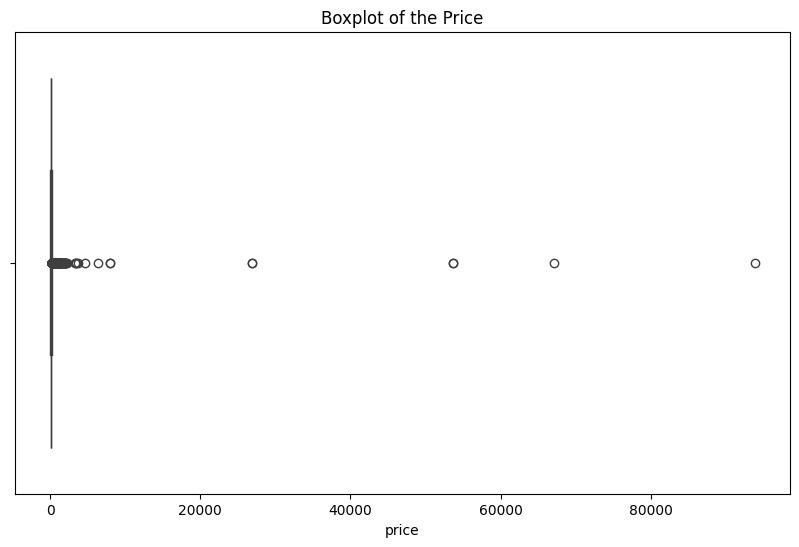

In [175]:
# Analysiere die Ausreiser in einem boxplot

# Create a boxplot to visualize the outliers in the 'price' column
#plt.figure(figsize=(10, 6))
#sns.boxplot(x='price', data=gdf_merged)
#plt.title('Boxplot of the Price')
#plt.show()

# save plot
#plt.savefig('Grafiken/boxplot_price.png')


# Create the figure and axis objects
fig, ax = plt.subplots(figsize=(10, 6))

# Create the boxplot
sns.boxplot(x='price', data=gdf_merged, ax=ax)

# Add title
ax.set_title('Boxplot of the Price')

# Show the plot
plt.show()

# Save the plot
fig.savefig('Grafiken/boxplot_price.png')


In [176]:
# Use the 99.5 percentile value as the threshold to filter the outliers
# Delte all rows where the price is higher than the threshold

threshold = gdf_merged['price'].quantile(0.995)
print(f"Threshold value in Euro: {threshold} €")

n_rows_before = gdf_merged.shape[0]
print("Number of rows before removing outliers: ", n_rows_before)
gdf_merged = gdf_merged[gdf_merged['price'] <= threshold]
n_rows_after = gdf_merged.shape[0]
print("Number of rows after removing outliers: ", n_rows_after)
print("Number of rows removed: ", n_rows_before - n_rows_after)


Threshold value in Euro: 1128.5999999999967 €
Number of rows before removing outliers:  8029
Number of rows after removing outliers:  7988
Number of rows removed:  41


### 1.3 Deskriptive Data Analysis (Plots, Analysis of Variables)

In [177]:
gdf_merged.describe()

,id,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,...,review_scores_rating,pt_condo,pt_apartment,pt_house,pt_rental_unit,pt_hotel,pt_hostel,rt_entire_home/ap,rt_private_room,rt_shared_room
count,7.988000e+03,7988.000000,7988.000000,7988.000000,7988.000000,7988.000000,7988.000000,7988.000000,7988.000000,7988.000000,...,7988.000000,7988.000000,7988.000000,7988.000000,7988.000000,7988.000000,7988.000000,7988.000000,7988.000000,7988.000000
mean,4.344829e+17,50.081419,14.429993,4.022409,1.296007,1.354407,2.535679,128.362609,3.349274,551.819479,...,4.730702,0.113295,0.097396,0.007011,0.675764,0.034802,0.009639,0.824362,0.148598,0.015899
std,4.534745e+17,0.016459,0.031737,2.531707,0.776908,0.997410,2.435209,103.646644,17.793086,441.656510,...,0.327991,0.316973,0.296515,0.083440,0.468118,0.183290,0.097713,0.380536,0.355714,0.125092
min,2.316300e+04,49.947830,14.271417,1.000000,0.000000,0.000000,0.000000,9.120000,1.000000,1.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.458330e+07,50.075771,14.417960,2.000000,1.000000,1.000000,1.000000,66.400000,1.000000,365.000000,...,4.660000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
50%,5.387218e+07,50.082290,14.428215,4.000000,1.000000,1.000000,2.000000,100.200000,2.000000,365.000000,...,4.810000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,8.987677e+17,50.089397,14.441910,5.000000,1.500000,2.000000,3.000000,155.910000,2.000000,1125.000000,...,4.920000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
max,1.119467e+18,50.170570,14.684160,16.000000,15.000000,34.000000,32.000000,1120.000000,900.000000,9000.000000,...,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


- *Listings:* There are 8,029 listed Airbnbs.
- *Accommodates:* On average, each place can have 4 guests.
- *Bathrooms and bedrooms:* There’s usually 1.3 bathrooms and 1.36 bedrooms in each place.
- *Beds:* Each place has about 2.56 beds.
- *Price:* The average price is 4,456.44, but this can change a lot because some places are much cheaper or more expensive.
- *Staying time:* You can usually stay at least 3 nights, but sometimes you can stay up to 553 nights.-
- *Distance to old town:* The places are about 2.12 km away from the old town center.
- *Number of Airbnbs and restaurants:* There are a lot of Airbnbs and restaurants in the area.

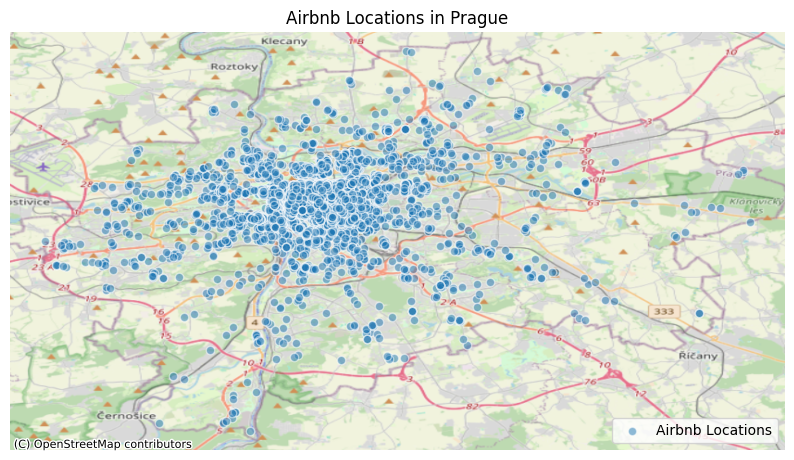

In [178]:
# visualization
f, ax = plt.subplots(1, figsize=(10, 10))
gdf_merged.plot(ax=ax, alpha=0.5, edgecolor='white')

# Hinzufügen einer Basiskarte
cx.add_basemap(ax=ax, crs=gdf_merged.crs, source=cx.providers.OpenStreetMap.Mapnik)

# Legende hinzufügen
ax.legend(['Airbnb Locations'], loc='lower right')

# Titel hinzufügen
ax.set_title('Airbnb Locations in Prague')

# Achsen ausschalten
ax.set_axis_off()

# save plot
plt.savefig('Grafiken/airbnb_locations_prague.png')

plt.show()



In [179]:
gdf_merged.explore()

- As expected, most of the Airbnbs are in the city center (Old Town of Prague)

In [180]:
# describe the price

# Jetzt wird die Beschreibung der `price` Spalte mit ganzen Zahlen angezeigt

print(df_listings['price'].describe(percentiles=[0.25, 0.5, 0.75, 0.95]))

# save the table
df_listings['price'].describe(percentiles=[0.25, 0.5, 0.75, 0.95]).to_csv('price_description.csv')





count     8029.000000
mean       178.257472
std       1608.713151
min          9.120000
25%         66.640000
50%        100.680000
75%        157.720000
95%        312.920000
max      93827.960000
Name: price, dtype: float64


As we can see, 95% of the prices are below 7823 USD. To see the price differences in the plot, I will only plot 95% of the airbnbs and ignore the 5% with the highest prices. This makes the influence of the space on price more visible.

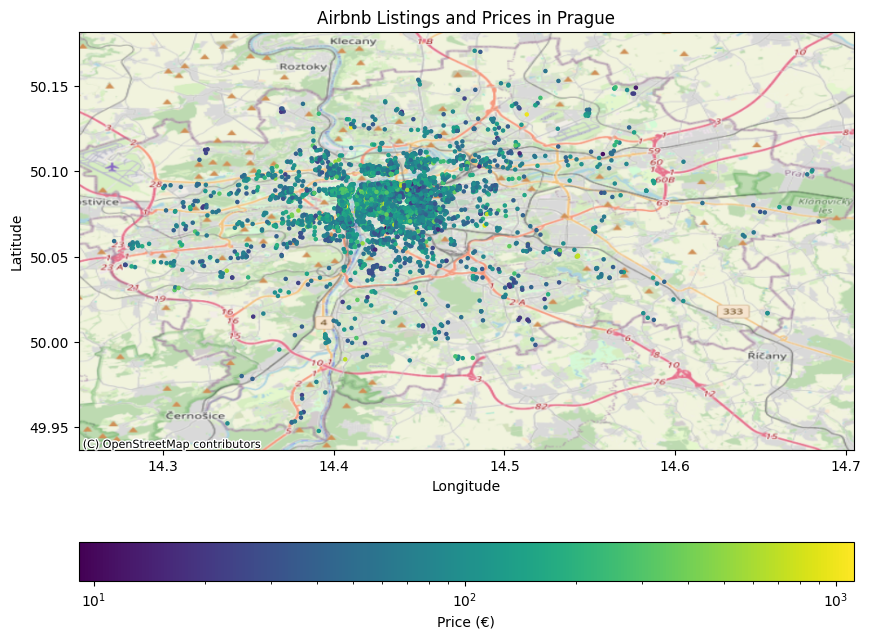

In [181]:
import matplotlib.pyplot as plt
import contextily as cx
import geopandas as gpd
from matplotlib.colors import LogNorm

# Assuming gdf_merged is your GeoDataFrame with Airbnb listings and price data
# For example:
# gdf_merged = gpd.read_file('path_to_your_geojson_or_shapefile')

# Plot the basemap of Prague
fig, ax = plt.subplots(figsize=(10, 8))

# Plot Airbnb listings with a logarithmic colormap
gdf_merged.plot(ax=ax, column='price', 
                legend=True, 
                legend_kwds={'label': "Price (€)", 'orientation': "horizontal"},
                markersize=5, 
                cmap='viridis', 
                norm=LogNorm(vmin=gdf_merged['price'].min(), vmax=gdf_merged['price'].max()))

# Add basemap using OpenStreetMap
cx.add_basemap(ax=ax, crs=gdf_merged.crs, source=cx.providers.OpenStreetMap.Mapnik)

# Set title and labels
plt.title('Airbnb Listings and Prices in Prague')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Save plot
plt.savefig('Grafiken/airbnb_listings_prices_prague.png')

# Show plot
plt.show()


- As expected, the most expensive Airbnbs are in the old town, close to the major tourist attractions
- The cheaper Aribnbs are outside of the city centre


In [182]:
# Create a base map using the centroid of your GeoDataFrame
m = fm.Map(location=[gdf_merged.geometry.centroid.y.mean(), gdf_merged.geometry.centroid.x.mean()], zoom_start=13)

# Add the GeoData
fm.GeoJson(gdf_neighbourhoods).add_to(m)

# Display the map
m

- here we can see all the neighborhoods of Prague in our dataset


What are the most expensive neighborhoods in Prague? In which neighborhood is the most expensive / cheapest price per Airbnb?

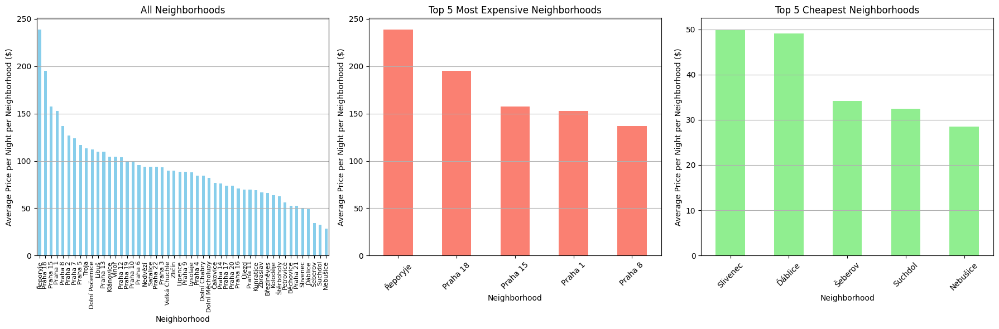

In [183]:
import matplotlib.pyplot as plt



# Calculate the average price per neighborhood

average_price_per_neighborhood = gdf_merged.groupby('neighbourhood')['price'].sum() / gdf_merged.groupby('neighbourhood').size()

# Sort the neighborhoods by average price
average_price_per_neighborhood = average_price_per_neighborhood.sort_values(ascending=False)

# Plotting
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plotting all neighborhoods
average_price_per_neighborhood.plot(kind='bar', color='skyblue', ax=axs[0])
axs[0].set_title('All Neighborhoods')
axs[0].set_xlabel('Neighborhood')
axs[0].set_ylabel('Average Price per Night per Neighborhood ($)')
axs[0].tick_params(axis='x', rotation=90, labelsize=8)  # Adjust font size here
axs[0].grid(axis='y')

# Plotting the five most expensive neighborhoods
most_expensive = average_price_per_neighborhood.head(5)
most_expensive.plot(kind='bar', color='salmon', ax=axs[1])
axs[1].set_title('Top 5 Most Expensive Neighborhoods')
axs[1].set_xlabel('Neighborhood')
axs[1].set_ylabel('Average Price per Night per Neighborhood ($)')
axs[1].tick_params(axis='x', rotation=45)
axs[1].grid(axis='y')

# Plotting the five cheapest neighborhoods
cheapest = average_price_per_neighborhood.tail(5)
cheapest = cheapest.dropna()  # Drop neighborhoods not present in the top 5
cheapest.plot(kind='bar', color='lightgreen', ax=axs[2])
axs[2].set_title('Top 5 Cheapest Neighborhoods')
axs[2].set_xlabel('Neighborhood')
axs[2].set_ylabel('Average Price per Night per Neighborhood ($)')
axs[2].tick_params(axis='x', rotation=45)
axs[2].grid(axis='y')

plt.tight_layout()

# save plot
plt.savefig('Grafiken/average_price_per_neighborhood.png')

plt.show()




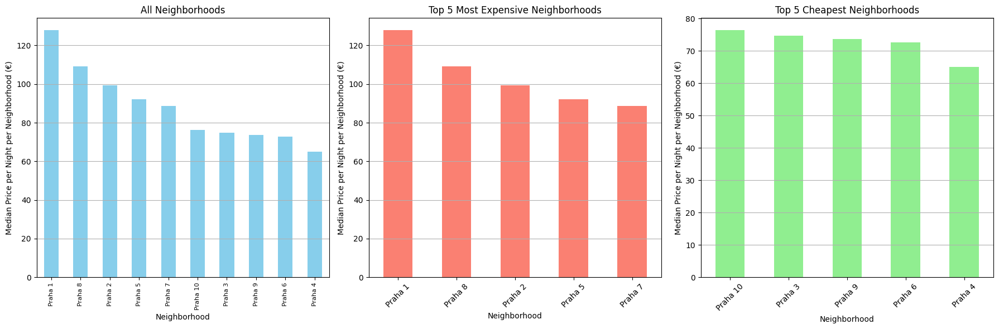

In [184]:
import matplotlib.pyplot as plt


# filter only the neighborhoods with more than 50 listings
gdf_filtered = gdf_merged.groupby('neighbourhood').filter(lambda x: len(x) > 50)

median_price_per_neighborhood  = gdf_filtered.groupby('neighbourhood')['price'].median() 

# Sort the neighborhoods by average price
median_price_per_neighborhood = median_price_per_neighborhood.sort_values(ascending=False)

# Plotting
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plotting all neighborhoods
median_price_per_neighborhood.plot(kind='bar', color='skyblue', ax=axs[0])
axs[0].set_title('All Neighborhoods')
axs[0].set_xlabel('Neighborhood')
axs[0].set_ylabel('Median Price per Night per Neighborhood (€)')
axs[0].tick_params(axis='x', rotation=90, labelsize=8)  # Adjust font size here
axs[0].grid(axis='y')

# Plotting the five most expensive neighborhoods
most_expensive = median_price_per_neighborhood.head(5)
most_expensive.plot(kind='bar', color='salmon', ax=axs[1])
axs[1].set_title('Top 5 Most Expensive Neighborhoods')
axs[1].set_xlabel('Neighborhood')
axs[1].set_ylabel('Median Price per Night per Neighborhood (€)') 
axs[1].tick_params(axis='x', rotation=45)
axs[1].grid(axis='y')

# Plotting the five cheapest neighborhoods
cheapest = median_price_per_neighborhood.tail(5)
cheapest = cheapest.dropna()  # Drop neighborhoods not present in the top 5
cheapest.plot(kind='bar', color='lightgreen', ax=axs[2])
axs[2].set_title('Top 5 Cheapest Neighborhoods')
axs[2].set_xlabel('Neighborhood')
axs[2].set_ylabel('Median Price per Night per Neighborhood (€)')
axs[2].tick_params(axis='x', rotation=45)
axs[2].grid(axis='y')

plt.tight_layout()

# save plot
plt.savefig('Grafiken/median_price_per_neighborhood.png')

plt.show()




In [185]:
# Plotting the five cheapest neighborhoods
cheapest = median_price_per_neighborhood.tail(5)
cheapest = cheapest.dropna()  # Drop neighborhoods not present in the top 5
cheapest.plot(kind='bar', color='lightgreen', ax=axs[2])
axs[2].set_title('Top 5 Cheapest Neighborhoods')
axs[2].set_xlabel('Neighborhood')
axs[2].set_ylabel('Average Price per Night per Neighborhood ($)')
axs[2].tick_params(axis='x', rotation=45)
axs[2].grid(axis='y')

plt.tight_layout()

# save plot
plt.savefig('Grafiken/median_price_per_neighborhood.png')

plt.show()

<Figure size 640x480 with 0 Axes>

In [186]:
average_price_per_neighborhood.head(5)

neighbourhood
Řeporyje    239.010000
Praha 18    195.014545
Praha 15    157.361600
Praha 1     152.580128
Praha 8     136.866904
dtype: float64

In [187]:
# Filter the DataFrame to include only the most expensive neighborhoods
most_expensive_neighborhoods = ['Praha 3', 'Řeporyje', 'Praha 18', 'Praha 1', 'Praha 12']
filtered_df = df_listings[df_listings['neighbourhood_cleansed'].isin(most_expensive_neighborhoods)]

# Count the number of observations in each neighborhood
apartments_per_neighborhood = filtered_df['neighbourhood_cleansed'].value_counts()

# Print the result
print(apartments_per_neighborhood)


neighbourhood_cleansed
Praha 1     3234
Praha 3      824
Praha 12      20
Praha 18      11
Řeporyje       4
Name: count, dtype: int64


In [188]:
gdf_merged.columns

Index(['id', 'latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'price', 'minimum_nights', 'maximum_nights',
       'number_of_reviews', 'review_scores_rating', 'pt_condo', 'pt_apartment',
       'pt_house', 'pt_rental_unit', 'pt_hotel', 'pt_hostel',
       'rt_entire_home/ap', 'rt_private_room', 'rt_shared_room', 'geometry',
       'neighbourhood'],
      dtype='object')

<Axes: xlabel='neighbourhood_cleansed'>

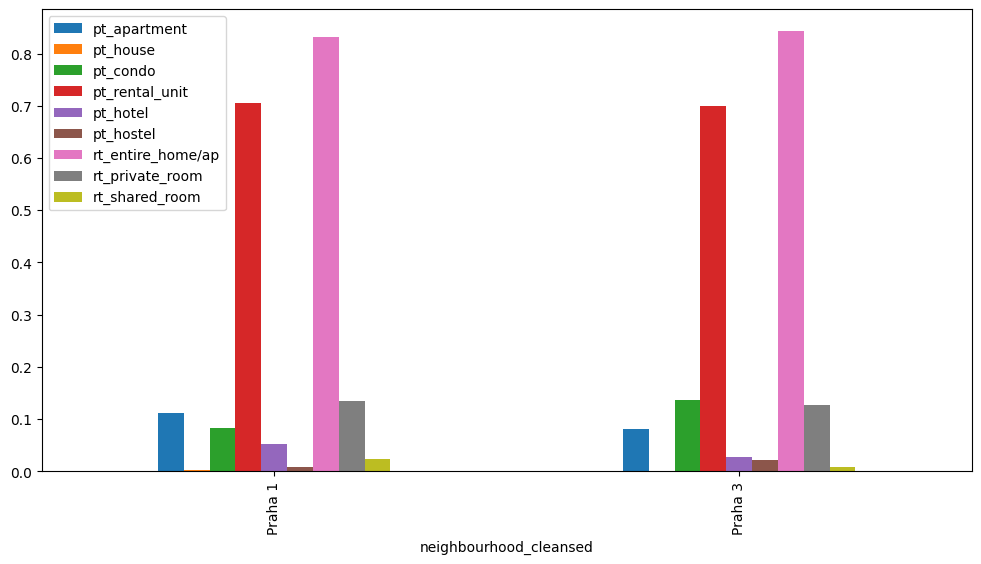

In [189]:
# Specify the neighborhoods and property types
neighborhoods = ['Praha 1', 'Řeporyje', 'Praha 18', 'Praha 3', 'Praha 12']
neighborhoods = ['Praha 1','Praha 3']
property_types = ['pt_apartment', 'pt_house', 'pt_condo', 'pt_rental_unit', 'pt_hotel', 'pt_hostel', 'rt_entire_home/ap', 'rt_private_room', 'rt_shared_room']

# Filter the dataframe for the specified neighborhoods
filtered_df = df_listings[df_listings['neighbourhood_cleansed'].isin(neighborhoods)]

# Calculate the average values for each property type
average_values = filtered_df.groupby('neighbourhood_cleansed')[property_types].mean()

# Plot the average values
average_values.plot(kind='bar', figsize=(12, 6))


Which neighborhoods have the most Airbnbs?

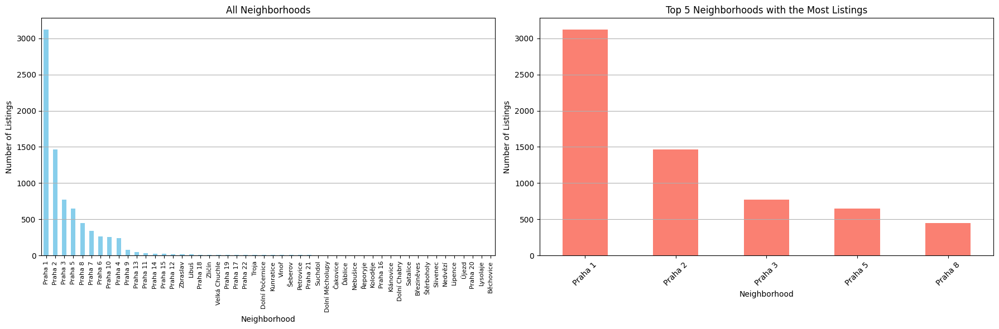

In [190]:
# Which neighborhoods have the most Airbnbs?

# Count the number of Airbnbs per neighborhood
listings_per_neighborhood = gdf_merged['neighbourhood'].value_counts()

# Sort the neighborhoods by number of listings
listings_per_neighborhood = listings_per_neighborhood.sort_values(ascending=False)

# Plotting
fig, axs = plt.subplots(1, 2, figsize=(18, 6))

# Plotting all neighborhoods

listings_per_neighborhood.plot(kind='bar', color='skyblue', ax=axs[0])

axs[0].set_title('All Neighborhoods')

axs[0].set_xlabel('Neighborhood')

axs[0].set_ylabel('Number of Listings')

axs[0].tick_params(axis='x', rotation=90, labelsize=8)  # Adjust font size here

axs[0].grid(axis='y')

# Plotting the five neighborhoods with the most listings

most_listings = listings_per_neighborhood.head(5)

most_listings.plot(kind='bar', color='salmon', ax=axs[1])

axs[1].set_title('Top 5 Neighborhoods with the Most Listings')

axs[1].set_xlabel('Neighborhood')

axs[1].set_ylabel('Number of Listings')

axs[1].tick_params(axis='x', rotation=45)

axs[1].grid(axis='y')



plt.tight_layout()

# save plot
plt.savefig('Grafiken/listings_per_neighborhood.png')

plt.show()



- The most Airbnbs has Praha 1, which is not a surprise because it is the city centre of Prague.

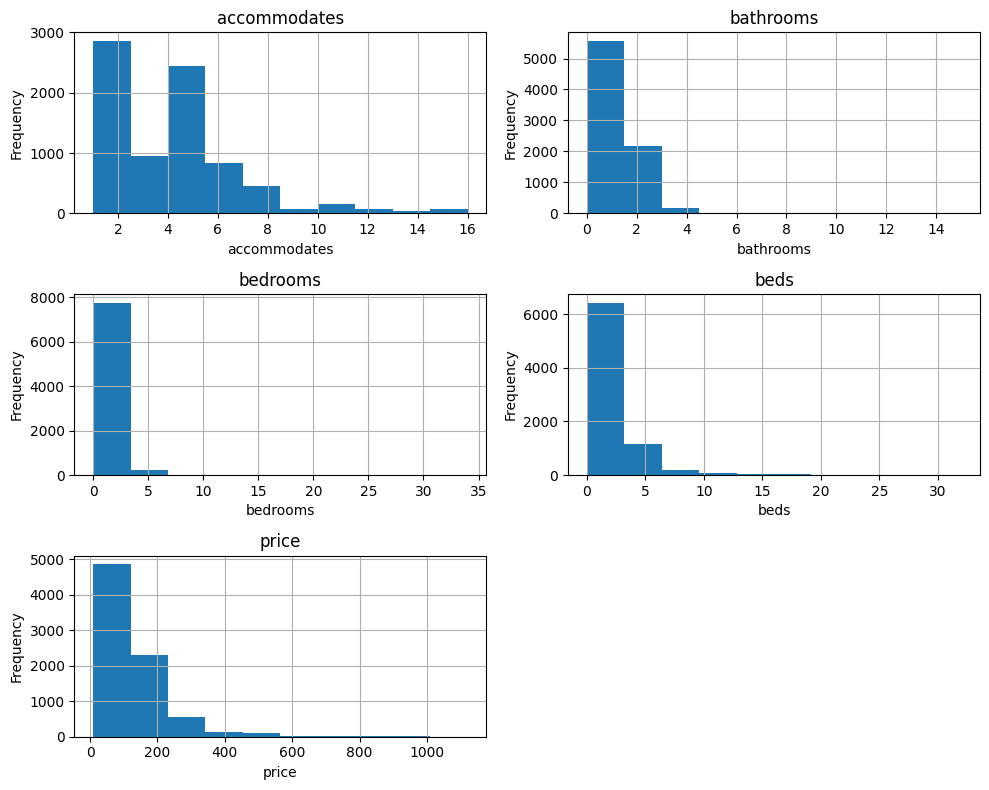

In [191]:
# Histograms for the numerical non-binary columns
numerical_columns = ["accommodates", "bathrooms", "bedrooms", "beds", "price"]
axes = gdf_merged[numerical_columns].hist(figsize=(10, 8))

for ax, column in zip(axes.flatten(), numerical_columns):
    ax.set_xlabel(column)
    ax.set_ylabel("Frequency")

plt.tight_layout()


# save plot
plt.savefig('Grafiken/numerical_columns_histograms.png')

plt.show()



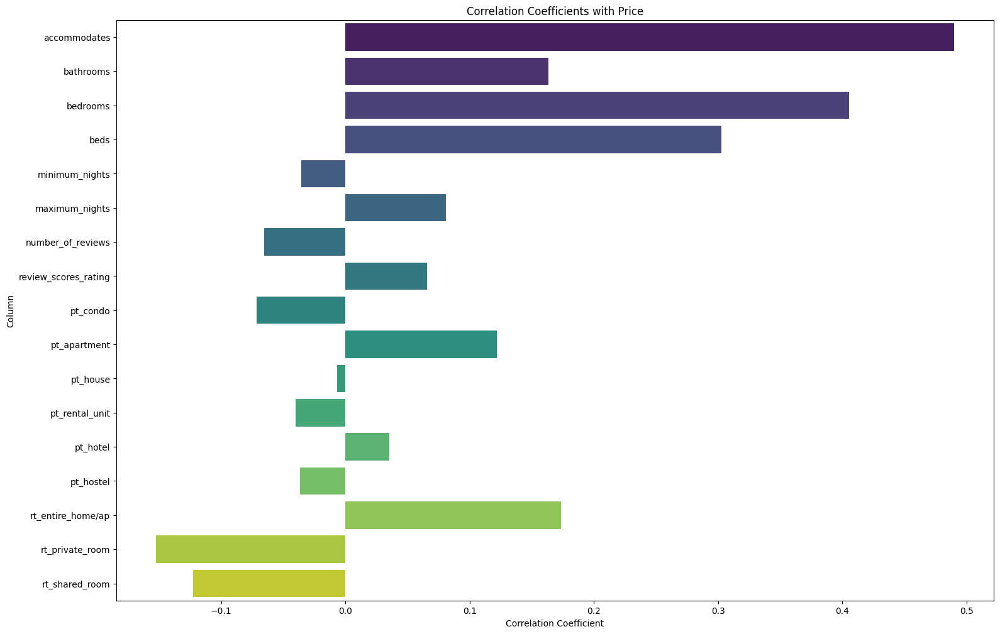

In [192]:
# Define numerical columns excluding 'latitude' and 'longitude'
numerical_columns = [col for col in gdf_merged.columns if col != 'latitude' and col != 'longitude' and col != "id" and gdf_merged[col].dtype in ['int64', 'float64']]

# Calculate correlation coefficients
correlation_matrix = gdf_merged[numerical_columns].corr()

# Extract correlations with price
price_correlations = correlation_matrix['price'].drop('price')

# Plot correlation coefficients
plt.figure(figsize=(18, 12))
sns.barplot(x=price_correlations.values, y=price_correlations.index, palette='viridis')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Column')
plt.title('Correlation Coefficients with Price')

# save plot
plt.savefig('Grafiken/correlation_coefficients.png')

plt.show()


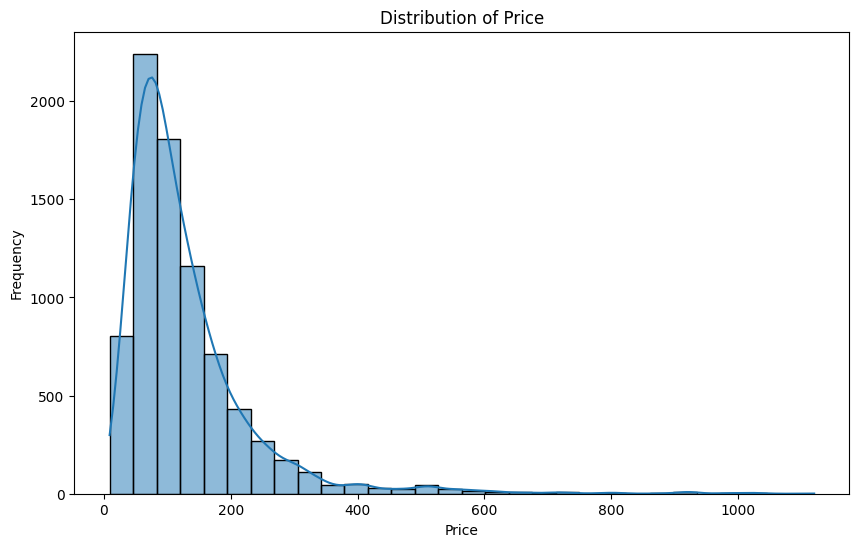

In [193]:
plt.figure(figsize=(10, 6))
sns.histplot(gdf_merged['price'], bins=30, kde=True)
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.title('Distribution of Price')

# save plot
plt.savefig('Grafiken/price_distribution.png')

plt.show()



##### Room Type and Property Type

What is the most common / least room type in Prague?

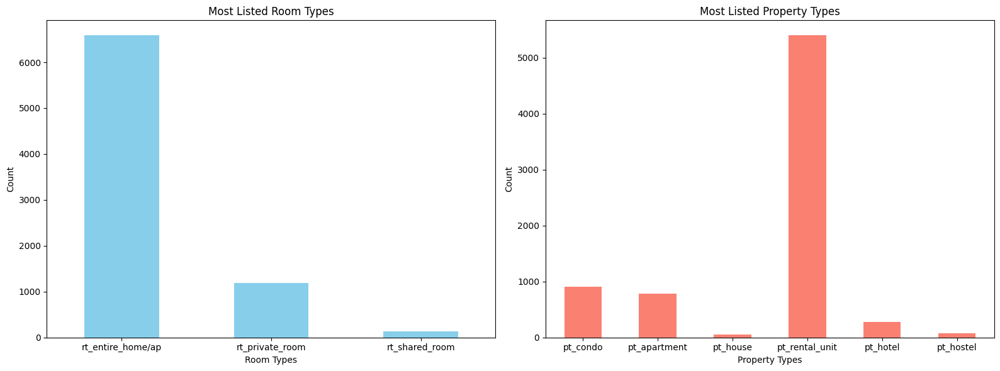

In [194]:

# Binary columns to Visualization
room_type_columns = ['rt_entire_home/ap', 'rt_private_room', 'rt_shared_room']
property_type_columns = ['pt_condo', 'pt_apartment', 'pt_house', 'pt_rental_unit', 'pt_hotel', 'pt_hostel']

# Calculate the sum of each column
room_type_sums = gdf_merged[room_type_columns].sum()
property_type_sums = gdf_merged[property_type_columns].sum()

# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

# Plot room type sums
room_type_sums.plot(kind='bar', ax=axes[0], rot=0, color='skyblue')
axes[0].set_title('Most Listed Room Types')
axes[0].set_xlabel('Room Types')
axes[0].set_ylabel('Count')

# Plot property type sums
property_type_sums.plot(kind='bar', ax=axes[1], rot=0, color='salmon')
axes[1].set_title('Most Listed Property Types')
axes[1].set_xlabel('Property Types')
axes[1].set_ylabel('Count')

plt.tight_layout()

# save plot
plt.savefig('Grafiken/room_property_type_sums.png')

plt.show()



In [195]:
# Get the median price per room type / property type
room_type_columns = ['rt_entire_home/ap', 'rt_private_room', 'rt_shared_room']
property_type_columns = ['pt_condo', 'pt_apartment', 'pt_house', 'pt_rental_unit', 'pt_hotel', 'pt_hostel']

# Calculate the mean price per room type
room_type_mean_price = gdf_merged.groupby(room_type_columns)['price'].mean()

# Calculate the median price per property type
property_type_mean_price = gdf_merged.groupby(property_type_columns)['price'].mean()



In [196]:
room_type_mean_price

rt_entire_home/ap  rt_private_room  rt_shared_room
0                  0                0                 160.727640
                                    1                  28.321890
                   1                0                  90.570682
1                  0                0                 136.666891
Name: price, dtype: float64

In [197]:
property_type_mean_price

pt_condo  pt_apartment  pt_house  pt_rental_unit  pt_hotel  pt_hostel
0         0             0         0               0         0            133.182823
                                                            1             89.674286
                                                  1         0            147.711655
                                  1               0         0            125.489937
                        1         0               0         0            119.891429
          1             0         0               0         0            166.852185
1         0             0         0               0         0            107.639204
Name: price, dtype: float64

In [198]:
# Daten für room_type_mean_price
room_type_mean_price = pd.DataFrame({
    'room_type': ['Entire home', 'Private room', 'Shared room'],
    'mean_price': [136.67, 90.57, 28.321]
})

# Daten für property_type_mean_price
property_type_mean_price = pd.DataFrame({
    'property_type': ['Condo', 'Apartment', 'House', 'Rental unit', 'Hotel', 'Hostel'],
    'mean_price': [107.64, 166.85, 119.89, 125.49, 147.71, 89.67]
})

# Ausgabe der DataFrames zur Überprüfung
print(room_type_mean_price)
print(property_type_mean_price)


      room_type  mean_price
0   Entire home     136.670
1  Private room      90.570
2   Shared room      28.321
  property_type  mean_price
0         Condo      107.64
1     Apartment      166.85
2         House      119.89
3   Rental unit      125.49
4         Hotel      147.71
5        Hostel       89.67


What is the most expensive / cheapest property type / room type in Prague?

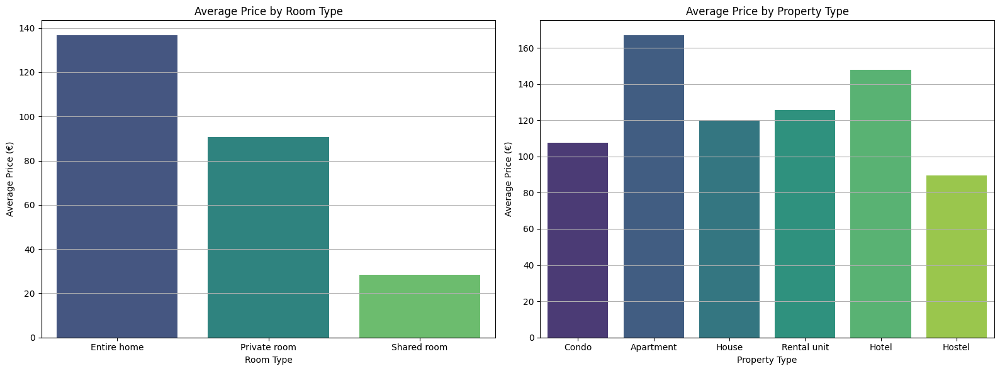

In [199]:
# Average price by room type and property type


# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

# Create roomtype bar plot
sns.barplot(x='room_type', y='mean_price', data=room_type_mean_price, ax=axes[0], palette='viridis')
axes[0].set_title('Average Price by Room Type')
axes[0].set_xlabel('Room Type')
axes[0].set_ylabel('Average Price (€)')
axes[0].grid(axis='y')

# Create propertytype bar plot
sns.barplot(x='property_type', y='mean_price', data=property_type_mean_price, ax=axes[1], palette='viridis')
axes[1].set_title('Average Price by Property Type')
axes[1].set_xlabel('Property Type')
axes[1].set_ylabel('Average Price (€)')
axes[1].grid(axis='y')


plt.tight_layout()

# save plot

plt.savefig('Grafiken/average_price_room_property_type.png')

plt.show()




- Entire home is the most expensive room type and shared room the cheapest room type

- The most expensive property type is rental unit followed by condo and apartment. The least expensive property type is house and hostel.

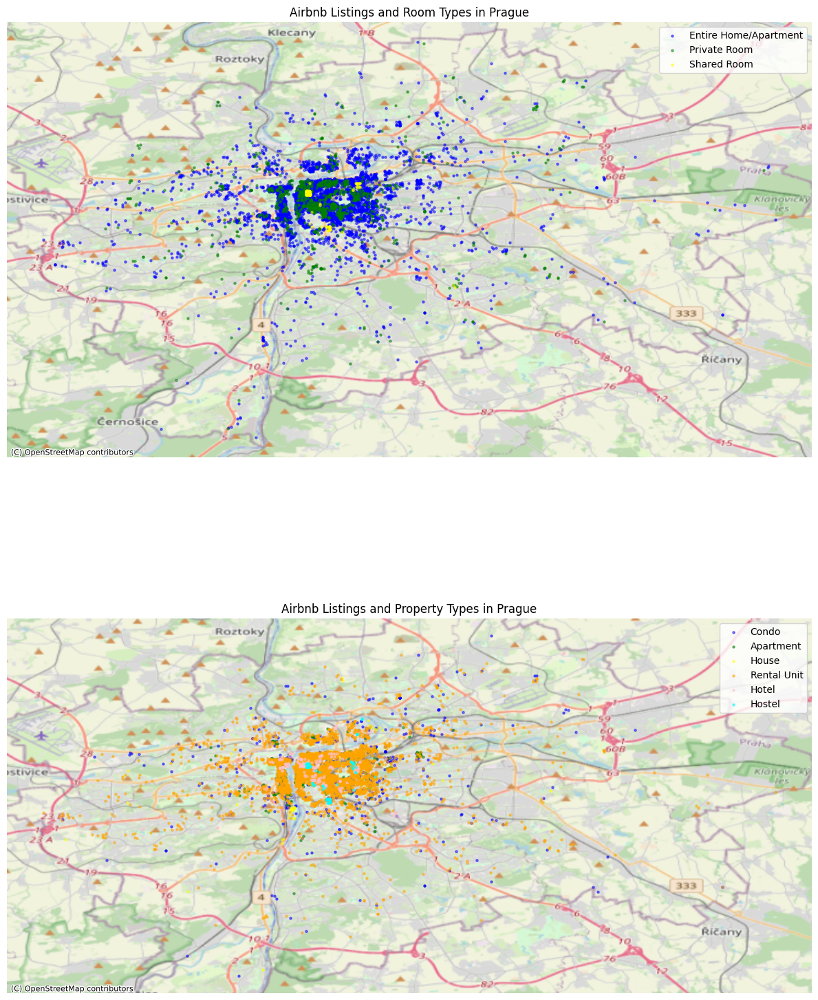

In [200]:


# Set up figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 18))

# Plot Airbnb properties depending on the room type

# Entire home/apartment in blue
gdf_merged[gdf_merged['rt_entire_home/ap'] == 1].plot(ax=ax1, color='blue', label='Entire Home/Apartment', markersize=5, alpha=0.5)
# Private room in green
gdf_merged[gdf_merged['rt_private_room'] == 1].plot(ax=ax1, color='green', label='Private Room', markersize=5, alpha=0.5)
# Shared room in yellow
gdf_merged[gdf_merged['rt_shared_room'] == 1].plot(ax=ax1, color='yellow', label='Shared Room', markersize=5, alpha=0.5)

# Add a basemap
cx.add_basemap(ax=ax1, crs=gdf_merged.crs, source=cx.providers.OpenStreetMap.Mapnik)

# Remove axes
ax1.set_axis_off()

# Add a legend
ax1.legend()

# Add a title
ax1.set_title('Airbnb Listings and Room Types in Prague')

# Plot Airbnb properties depending on the property type

# Condo in blue
gdf_merged[gdf_merged['pt_condo'] == 1].plot(ax=ax2, color='blue', label='Condo', markersize=5, alpha=0.5)
# Apartment in green
gdf_merged[gdf_merged['pt_apartment'] == 1].plot(ax=ax2, color='green', label='Apartment', markersize=5, alpha=0.5)
# House in yellow
gdf_merged[gdf_merged['pt_house'] == 1].plot(ax=ax2, color='yellow', label='House', markersize=5, alpha=0.5)
# Rental unit in orange
gdf_merged[gdf_merged['pt_rental_unit'] == 1].plot(ax=ax2, color='orange', label='Rental Unit', markersize=5, alpha=0.5)
# Hotel in pink
gdf_merged[gdf_merged['pt_hotel'] == 1].plot(ax=ax2, color='pink', label='Hotel', markersize=5, alpha=0.5)
# Hostel in bright blue
gdf_merged[gdf_merged['pt_hostel'] == 1].plot(ax=ax2, color='cyan', label='Hostel', markersize=5, alpha=0.5)

# Add a basemap
cx.add_basemap(ax=ax2, crs=gdf_merged.crs, source=cx.providers.OpenStreetMap.Mapnik)

# Remove axes
ax2.set_axis_off()

# Add a legend
ax2.legend()

# Add a title
ax2.set_title('Airbnb Listings and Property Types in Prague')

# Show the plot
plt.tight_layout()

# save plot
plt.savefig('Grafiken/room_property_type_map.png')

plt.show()





Property types: 
- Most rental units are in the city center and outside (they are also the most common property types)
- Most hostels are in the city center
- Most Condos are outside the city Center

Room Types:

- Most Room types are in the city Center
- Entire Home / apartments are in the city center but also outside of the city center

# PART 2 Feature Engineering: Get points-of-interest (POIs) and prepare them for the model

Points of Interest:

- Proximity to Old Town (and Major Sightseeing Spots)
- Proximity to Public Transportation Hubs
- Density of Restaurants, Bars, Fast Food and Cafes
- Density of Shopping Centers / Markets

In [201]:
# Define tags for each category


sightseeing_tags = {
    'tourism': ['museum', 'attraction', 'viewpoint', 'zoo', 'theme_park', 'gallery', 'monument'],
    'historic': True,
    'leisure': ['park', 'garden']
}

transportation_hubs_tags = {
    'amenity': ['bus_station', 'taxi', 'car_rental', 'car_sharing']
}

shopping_tags = {
    'amenity': ['marketplace', 'food_court'],
    'shop': True
}

dining_and_entertainment_tags = {
    'amenity': ['bar', 'restaurant', 'cafe', 'fast_food']
}



In [202]:
# Load POIs within a 3km radius from the center of Prague for each category
pois_sightseeing = ox.features_from_address("Prague, Czech Republic", dist=3000, tags=sightseeing_tags)
pois_transportation_hubs = ox.features_from_address("Prague, Czech Republic", dist=3000, tags=transportation_hubs_tags)
pois_shopping = ox.features_from_address("Prague, Czech Republic", dist=3000, tags=shopping_tags)
pois_dining_and_entertainment = ox.features_from_address("Prague, Czech Republic", dist=3000, tags=dining_and_entertainment_tags)



In [203]:
# Function to filter columns and reset index
def filter_columns(pois, extra_columns=None):
    default_columns = ["element_type", "osmid", "name", "geometry"]
    if extra_columns:
        columns = default_columns + extra_columns
    else:
        columns = default_columns
    return pois.reset_index()[columns].dropna(subset=['geometry'])



In [204]:
# Apply the function to each POI DataFrame
pois_sightseeing = filter_columns(pois_sightseeing, ['tourism', 'historic', 'leisure'])
pois_transportation_hubs = filter_columns(pois_transportation_hubs, ['amenity'])
pois_shopping = filter_columns(pois_shopping, ['amenity', 'shop'])
pois_dining_and_entertainment = filter_columns(pois_dining_and_entertainment, ['amenity'])


In [205]:
# Concatenate all POIs into one DataFrame
pois = pd.concat([pois_sightseeing, pois_transportation_hubs, pois_shopping, pois_dining_and_entertainment], ignore_index=True)



In [206]:
pois.head()

,element_type,osmid,name,geometry,tourism,historic,leisure,amenity,shop
0,node,289249253,NaN,POINT (14.42078 50.06541),viewpoint,NaN,NaN,NaN,NaN
1,node,292752425,NaN,POINT (14.41666 50.06340),viewpoint,NaN,NaN,NaN,NaN
2,node,292752430,NaN,POINT (14.41707 50.06289),viewpoint,NaN,NaN,NaN,NaN
3,node,292754380,Gorlice,POINT (14.42122 50.06524),museum,NaN,NaN,NaN,NaN
4,node,292756808,Vyšehradské kasematy,POINT (14.41927 50.06520),museum,NaN,NaN,NaN,NaN


#### Data cleaning

The resulting `pois` geodataframe may have a composite row index. In addition, some POIs may be of a strange element_type. You can use the following code to eliminate these issues.

In [207]:
# Clean the POI data
pois.reset_index(inplace=True) # reset the index of the data frame
pois = pois[pois.element_type=="node"] # eliminate all POIs that are not of the type "node"
pois.head() # check the results

,index,element_type,osmid,name,geometry,tourism,historic,leisure,amenity,shop
0,0,node,289249253,NaN,POINT (14.42078 50.06541),viewpoint,NaN,NaN,NaN,NaN
1,1,node,292752425,NaN,POINT (14.41666 50.06340),viewpoint,NaN,NaN,NaN,NaN
2,2,node,292752430,NaN,POINT (14.41707 50.06289),viewpoint,NaN,NaN,NaN,NaN
3,3,node,292754380,Gorlice,POINT (14.42122 50.06524),museum,NaN,NaN,NaN,NaN
4,4,node,292756808,Vyšehradské kasematy,POINT (14.41927 50.06520),museum,NaN,NaN,NaN,NaN


In [208]:
# Count the number of POIs in each category
sightseeing_count = pois_sightseeing.shape[0]  # Total number of sightseeing POIs
transportation_count = pois_transportation_hubs.shape[0]  # Total number of transportation hubs POIs
shopping_count = pois_shopping.shape[0]  # Total number of shopping POIs
dining_and_entertainment_count = pois_dining_and_entertainment.shape[0]  # Total number of dining and entertainment POIs

# Print the counts
print("Sightseeing Count:", sightseeing_count)
print("Transportation Hubs Count:", transportation_count)
print("Shopping Count:", shopping_count)
print("Dining and Entertainment Count:", dining_and_entertainment_count)


Sightseeing Count: 2459
Transportation Hubs Count: 14
Shopping Count: 2654
Dining and Entertainment Count: 2066


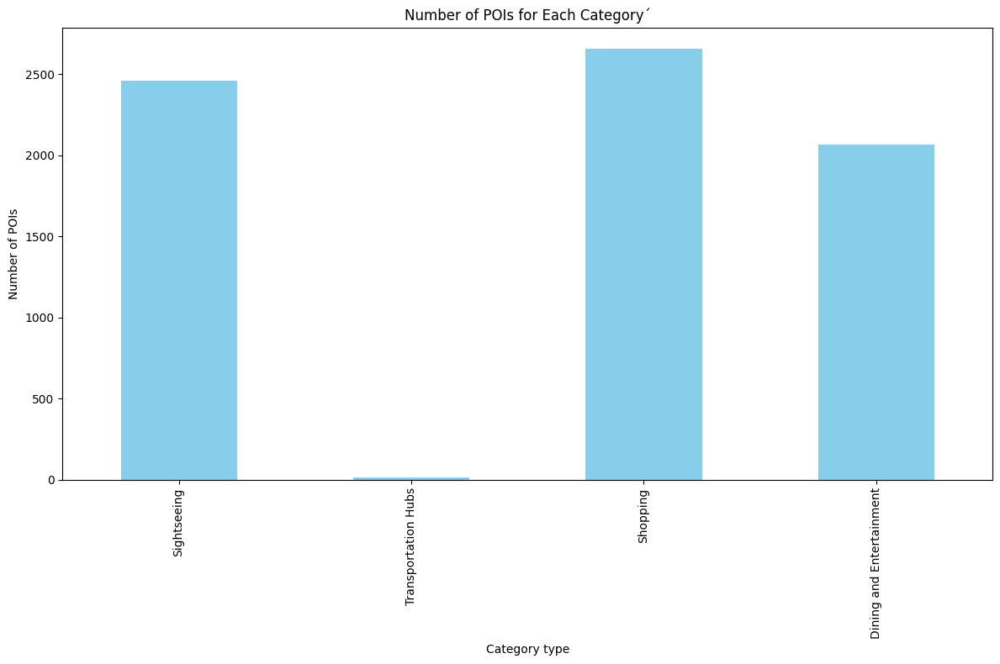

In [209]:
# Define the counts for each category
poi_counts = {
    'Sightseeing': sightseeing_count,
    'Transportation Hubs': transportation_count,
    'Shopping': shopping_count,
    'Dining and Entertainment': dining_and_entertainment_count
}

# Convert the counts dictionary to a pandas Series
poi_counts_series = pd.Series(poi_counts)

# Plot the bar plot
poi_counts_series.plot(kind='bar', figsize=(12, 8), color='skyblue')

# Set the title and axis labels
plt.title('Number of POIs for Each Category´')
plt.xlabel('Category type')
plt.ylabel('Number of POIs')

# Adjust layout to prevent label cut-off
plt.tight_layout()

# save plot
plt.savefig('Grafiken/poi_counts.png') 


# Show the plot
plt.show()


- the most common POIs are related to Shopping, after that Sightseeing and then Dining and Entertainment. Transportation Hubs have the least number of POIs.

/var/folders/4j/tc3nzkz10kd6976_d_mmfh680000gp/T/ipykernel_2133/1595659759.py:34: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


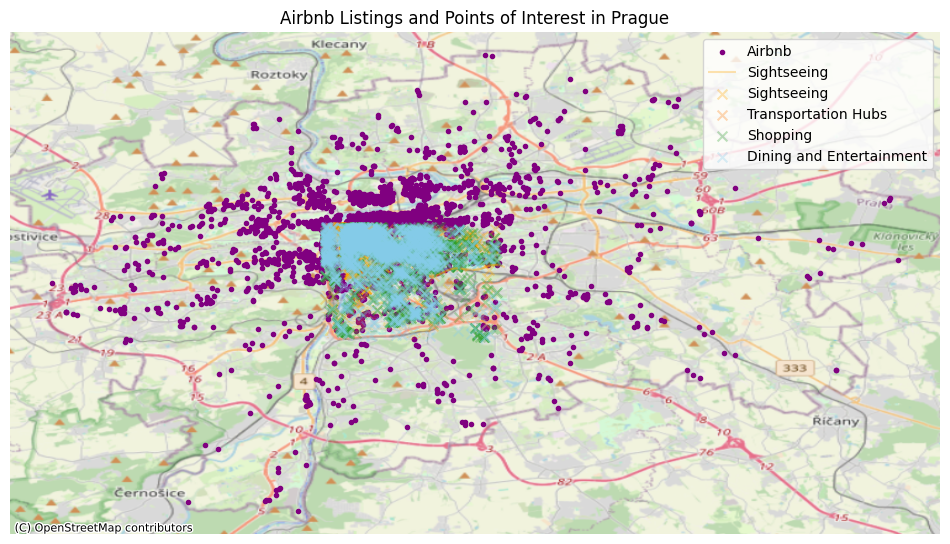

In [210]:
# Plot the POIs spatially (use again a background map of Prague)
# When you use POIs of different POI types, color the POIs differently

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(12, 12))

# Plot Airbnb properties in purple
gdf_merged.plot(ax=ax, marker=".", color="purple", label="Airbnb")

# Define a color pattern
colors = plt.get_cmap('tab10')

# Plot each category of POIs with a different color and shape

# Sightseeing POIs in light orange with 'x' marker
pois_sightseeing.plot(ax=ax, color='orange', label="Sightseeing", markersize=50, marker="x", alpha=0.3)

# Transportation hubs POIs in green with 'x' marker
pois_transportation_hubs.plot(ax=ax, color=colors(1), label="Transportation Hubs", markersize=50, marker="x", alpha=0.3)

# Shopping POIs in blue with 'x' marker
pois_shopping.plot(ax=ax, color=colors(2), label="Shopping", markersize=50, marker="x", alpha=0.3)

# Dining and entertainment POIs in yellow with 'x' marker
pois_dining_and_entertainment.plot(ax=ax, color="skyblue", label="Dining and Entertainment", markersize=50, marker="x", alpha=0.3)

# Add a basemap
cx.add_basemap(ax, crs=gdf_merged.crs, source=cx.providers.OpenStreetMap.Mapnik)

# Remove axes
ax.set_axis_off()

# Add a legend
ax.legend()

# Add a title
ax.set_title('Airbnb Listings and Points of Interest in Prague')

# save plot
plt.savefig('Grafiken/poi_airbnb_map.png')

# Show the plot
plt.show()



- Most of the amenities are in the old town, where are also all the major tourist attractions -> also the highest airbnb prices
- The least amenities are outside of the city

#### KDE 

In [211]:
from scipy.stats import gaussian_kde

In [212]:
# helper function to convert the geometries into a suitable coordinate format for the KDE
def create_coordinate_array(geometries): 
    x_values = []
    y_values = []

# Iterate through each row in the GeoDataFrame
    for multipoint in geometries:
        # Ensure the geometry is indeed MultiPoint; if it's just a single Point, wrap it in a list
        points = list(multipoint.geoms) if hasattr(multipoint, "geoms") else [multipoint]
        
        # For each Point in the MultiPoint, extract x and y values
        for point in points:
            x_values.append(point.x)
            y_values.append(point.y)

    # Optionally, convert the lists to numpy arrays for further processing
    x_values = np.array(x_values)
    y_values = np.array(y_values)

    # Rearrange data to create a 2D array of x and y coordinates
    xy = np.vstack([x_values,y_values])

    return xy

In [213]:
def plot_kde(kde, xy, title):

    # Rearrange data to create a 2D array of x and y coordinates
    x_values,y_values = xy
    # Define the grid points where you want to calculate the density
    xmin, xmax = x_values.min(), x_values.max()
    ymin, ymax = y_values.min(), y_values.max()
    xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j] #generate 100 evenly spaced points between min and max

    # Evaluate the density at grid points
    density = kde(np.vstack([xx.ravel(), yy.ravel()]))
    density = density.reshape(xx.shape) # reshape to the original shape of xx (for plotting)
    


    plt.imshow(np.rot90(density), cmap='hot', extent=[xmin, xmax, ymin, ymax])
    plt.colorbar(label='Density')
    plt.scatter(x_values, y_values, s=10, c='blue', alpha=0.5)
    plt.title(title)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Set the y 
    


In [214]:
airbns_points = gdf_merged.geometry
sightseeing_points = pd.concat([pois[pois['tourism'].notnull()].geometry, pois[pois['historic'].notnull()].geometry, pois[pois['leisure'].notnull()].geometry])
transportation_hubs_points = pd.concat([pois[pois['amenity'] == 'bus_station'].geometry, pois[pois['amenity'] == 'taxi'].geometry, pois[pois['amenity'] == 'car_rental'].geometry, pois[pois['amenity'] == 'car_sharing'].geometry])
shopping_points = pd.concat([pois[pois['amenity'] == 'marketplace'].geometry, pois[pois['amenity'] == 'food_court'].geometry, pois[pois['shop'].notnull()].geometry])
dining_and_entertainment_points = pd.concat([pois[pois['amenity'] == 'bar'].geometry, pois[pois['amenity'] == 'restaurant'].geometry, pois[pois['amenity'] == 'cafe'].geometry, pois[pois['amenity'] == 'fast_food'].geometry])

In [215]:
transportation_hubs_points

2465    POINT (14.43471 50.08352)
2459    POINT (14.43947 50.05160)
2460    POINT (14.41667 50.08177)
2461    POINT (14.44129 50.06437)
2462    POINT (14.42012 50.08377)
2463    POINT (14.43294 50.08440)
2464    POINT (14.42960 50.08246)
2466    POINT (14.43641 50.08470)
2467    POINT (14.43090 50.07138)
2468    POINT (14.43479 50.08369)
2469    POINT (14.44158 50.05310)
2470    POINT (14.43439 50.08315)
Name: geometry, dtype: geometry

In [216]:
shopping_points

2496    POINT (14.42440 50.08392)
2947    POINT (14.44941 50.07831)
2955    POINT (14.43952 50.05091)
3452    POINT (14.47841 50.07133)
3544    POINT (14.41465 50.07275)
                  ...            
4915    POINT (14.40601 50.07216)
4916    POINT (14.40590 50.07232)
4917    POINT (14.42129 50.08337)
4918    POINT (14.44182 50.08608)
4919    POINT (14.42907 50.08071)
Name: geometry, Length: 2447, dtype: geometry

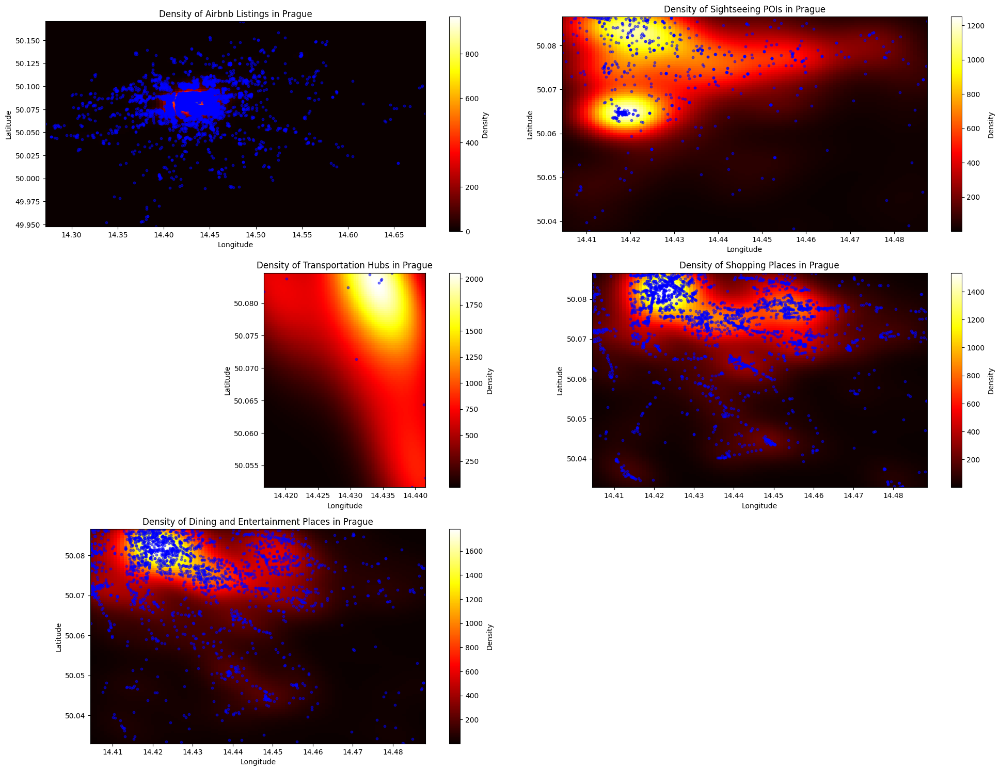

In [217]:
import matplotlib.pyplot as plt

# Create subplots
fig, axs = plt.subplots(3, 2, figsize=(20, 15))

# Density of Airbnb Listings
plt.sca(axs[0, 0])
coords_airbnbs = create_coordinate_array(airbns_points)
kde_func = gaussian_kde(coords_airbnbs)
plot_kde(kde_func, coords_airbnbs, 'Density of Airbnb Listings in Prague')
kde_airbnbs = kde_func(coords_airbnbs)

# Density of Sightseeing POIs
plt.sca(axs[0, 1])
coords_sightseeing = create_coordinate_array(sightseeing_points)
kde_func = gaussian_kde(coords_sightseeing)
plot_kde(kde_func, coords_sightseeing, 'Density of Sightseeing POIs in Prague')
kde_sightseeing = kde_func(coords_airbnbs)

# Density of Transportation Hubs
plt.sca(axs[1, 0])
coords_transportation = create_coordinate_array(transportation_hubs_points)
kde_func = gaussian_kde(coords_transportation)
plot_kde(kde_func, coords_transportation, 'Density of Transportation Hubs in Prague')
kde_transportation = kde_func(coords_airbnbs)

# Density of Shopping Places
plt.sca(axs[1, 1])
coords_shopping = create_coordinate_array(shopping_points)
kde_func = gaussian_kde(coords_shopping)
plot_kde(kde_func, coords_shopping, 'Density of Shopping Places in Prague')
kde_shopping = kde_func(coords_airbnbs)

# Density of Dining and Entertainment Places
plt.sca(axs[2, 0])
coords_dining_entertainment = create_coordinate_array(dining_and_entertainment_points)
kde_func = gaussian_kde(coords_dining_entertainment)
plot_kde(kde_func, coords_dining_entertainment, 'Density of Dining and Entertainment Places in Prague')
kde_dining_entertainment = kde_func(coords_airbnbs)

# Hide the last subplot (empty)
fig.delaxes(axs[2, 1])

# Adjust layout
plt.tight_layout()

# save plot
plt.savefig('Grafiken/density_plots.png')

# Show plot
plt.show()


In [218]:
coords_shopping

array([[14.4243952, 14.449408 , 14.4395223, ..., 14.4212917, 14.441817 ,
        14.4290688],
       [50.0839226, 50.0783093, 50.0509062, ..., 50.0833731, 50.0860794,
        50.0807057]])

In [219]:
coords_transportation

array([[14.43471  , 14.439468 , 14.4166668, 14.4412851, 14.4201215,
        14.4329356, 14.4296018, 14.4364081, 14.4309031, 14.4347865,
        14.441583 , 14.4343922],
       [50.0835155, 50.0516017, 50.0817698, 50.0643685, 50.0837696,
        50.0843993, 50.082463 , 50.0847017, 50.0713842, 50.0836894,
        50.0530971, 50.0831504]])

In [220]:
# Add the kde_airbns, kde_sightseeing, kde_transportation, kde_shopping, kde_dining_entertainment to the gdf_merged

gdf_merged['kde_airbnbs'] = kde_airbnbs
gdf_merged['kde_sightseeing'] = kde_sightseeing
gdf_merged['kde_transportation'] = kde_transportation
gdf_merged['kde_shopping'] = kde_shopping
gdf_merged['kde_dining_entertainment'] = kde_dining_entertainment


#### KDE Plots in Basemap

Create a spatial point plot(s) of the Airbnb listings and color the points according to the KDE estimates, in order to check your results.

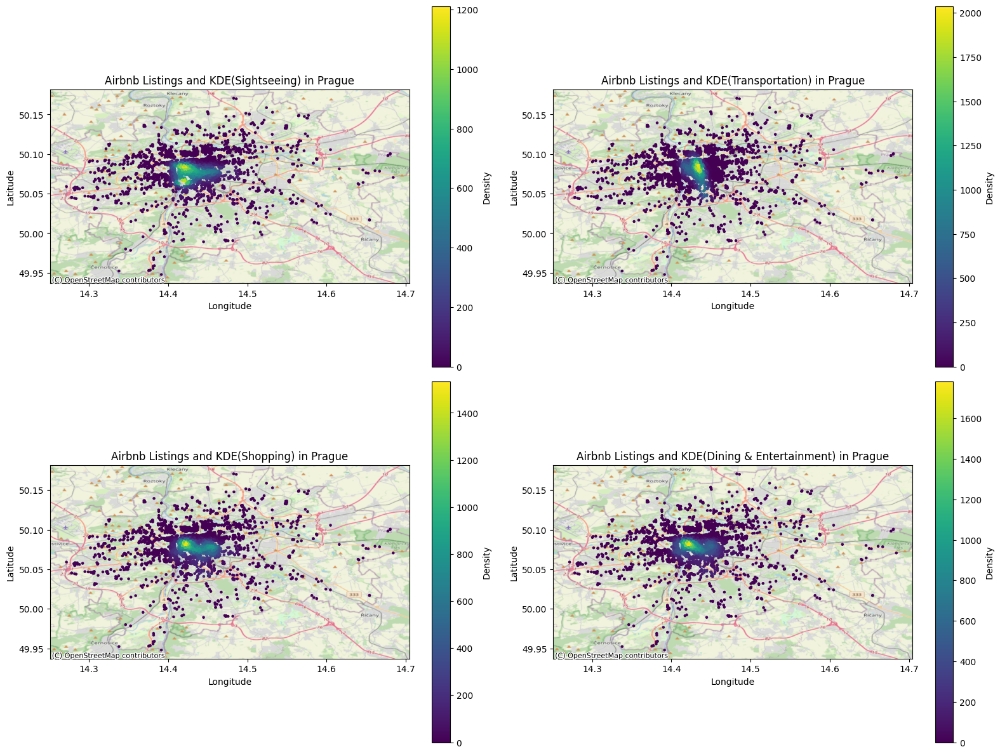

In [221]:

# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

# Plot 1: Airbnb Listings and KDE(Sightseeing)
ax = axes[0, 0]
gdf_merged.plot(ax=ax, column='kde_sightseeing', legend=True, legend_kwds={'label': "Density"}, markersize=5, cmap='viridis')
cx.add_basemap(ax=ax, crs=gdf_merged.crs, source=cx.providers.OpenStreetMap.Mapnik)
ax.set_title('Airbnb Listings and KDE(Sightseeing) in Prague')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Plot 2
ax = axes[0, 1]
gdf_merged.plot(ax=ax, column='kde_transportation', legend=True, legend_kwds={'label': "Density"}, markersize=5, cmap='viridis')
cx.add_basemap(ax=ax, crs=gdf_merged.crs, source=cx.providers.OpenStreetMap.Mapnik)
ax.set_title('Airbnb Listings and KDE(Transportation) in Prague')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Plot 3
ax = axes[1, 0]
gdf_merged.plot(ax=ax, column='kde_shopping', legend=True, legend_kwds={'label': "Density"}, markersize=5, cmap='viridis')
cx.add_basemap(ax=ax, crs=gdf_merged.crs, source=cx.providers.OpenStreetMap.Mapnik)
ax.set_title('Airbnb Listings and KDE(Shopping) in Prague')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Plot 4
ax = axes[1, 1]
gdf_merged.plot(ax=ax, column='kde_dining_entertainment', legend=True, legend_kwds={'label': "Density"}, markersize=5, cmap='viridis')
cx.add_basemap(ax=ax, crs=gdf_merged.crs, source=cx.providers.OpenStreetMap.Mapnik)
ax.set_title('Airbnb Listings and KDE(Dining & Entertainment) in Prague')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.tight_layout()

# save plot
plt.savefig('Grafiken/kde_airbnb_poi.png')

plt.show()





- All these Plots show that the highest density of amenities is in the Old town.
- There are also the highest Airbnb Prices and most of the Airbnbs are located there.

## Feature: Distance to Old Town

In [222]:
from geopy.distance import geodesic
from shapely.geometry import Point

# Coordinates of the Old Town in Prague (latitude, longitude)
old_town_coords = (50.0865, 14.4213)

# Function to calculate distance between Old Town and a point
def calculate_distance(airbnb_coords):
    return geodesic(old_town_coords, airbnb_coords).kilometers

# Convert latitude and longitude of each Airbnb listing to a Point geometry
gdf_merged['geometry'] = gpd.points_from_xy(gdf_merged['longitude'], gdf_merged['latitude'])

# Calculate the distance from each Airbnb listing to the Old Town
gdf_merged['distance_to_old_town_km'] = gdf_merged.apply(lambda row: calculate_distance((row['latitude'], row['longitude'])), axis=1)

# Print the updated DataFrame (or just the relevant columns for brevity)
print(gdf_merged[['latitude', 'longitude', 'distance_to_old_town_km']])


       latitude  longitude  distance_to_old_town_km
0     50.082290  14.415520                 0.624832
1     50.088300  14.422720                 0.224529
2     50.087290  14.431790                 0.755857
3     50.088210  14.426230                 0.400823
4     50.082280  14.413450                 0.732106
...         ...        ...                      ...
8361  50.089833  14.418254                 0.430063
8362  50.074702  14.431016                 1.485145
8363  50.072252  14.393559                 2.540568
8364  50.081710  14.432030                 0.934677
8365  50.077946  14.426331                 1.017295

[7988 rows x 3 columns]


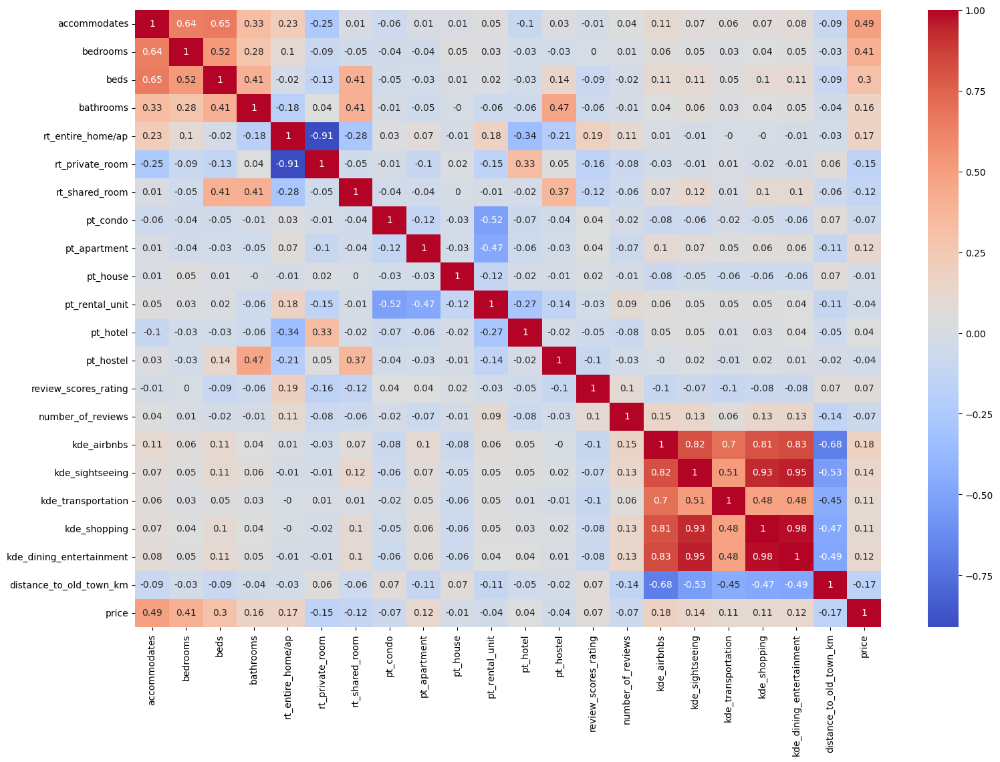

In [223]:
# Now plot the heatmap of the correlation matrix 
correlation_matrix = gdf_merged[numerical_columns].corr().round(2) 

# Make the figure large
plt.figure(figsize=(18, 12))

# Plot the heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

# save plot
plt.savefig('Grafiken/heatmap.png')

plt.show()

# PART 3: Models

In [224]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(gdf_merged.index, test_size=0.2, random_state=0)

In [225]:
prop_cols = [
     "accommodates",
    "bedrooms",
    "beds",
    "bathrooms",
    "rt_entire_home/ap",
    "rt_private_room",
    "rt_shared_room",
    "pt_condo",
    "pt_apartment",
    "pt_house",
    "pt_rental_unit",
    "pt_hotel",
    "pt_hostel",
    'review_scores_rating',
    'number_of_reviews'
]

poi_cols = ["kde_airbnbs",
    "kde_sightseeing",
    "kde_transportation",
    "kde_shopping",
    "kde_dining_entertainment",
    "distance_to_old_town_km"
]

In [226]:
X = gdf_merged[prop_cols + poi_cols]
y = gdf_merged['price']

In [227]:
prop_and_poi_cols = prop_cols + poi_cols


In [228]:

# correlated features are those with a correlation coefficient greater than 0.7 in the corr_matrix
corr_cols = set()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > 0.7:
            colname = corr_matrix.columns[i]
            corr_cols.add(colname)

# Print the correlated columns
print(corr_cols)



{'rt_private_room', 'kde_sightseeing', 'kde_dining_entertainment', 'kde_shopping'}


In [229]:
prop_and_poi_cols_indep = list(set(prop_and_poi_cols) - corr_cols)

## 2. Regression Models

In [230]:

def evaluate(val_y_pred, val_y):
    rmse = np.sqrt(np.mean((val_y_pred - val_y) ** 2))
    # Calculate the  root median squared error
    median_rmse = np.sqrt(np.median((val_y_pred - val_y) ** 2))

    print(f'The root mean squared error of the model is {rmse:.2f}')
    print(f'The root median squared error of the model is {median_rmse:.2f}')

    return rmse, median_rmse




In [231]:
def run_baseline(train_y, val_y):
    # Calculate the mean price of the training set
    mean_price = train_y.mean()
    # Predict the mean price for all observations in the validation set
    val_y_pred = np.repeat(mean_price, len(val_y))
    # Evaluate the model
    return evaluate(val_y_pred, val_y)

In [232]:
# Create a table to store the results
results = pd.DataFrame(columns=['Model', 'RMSE', 'RMeSE', 'Rel. Impr. RMSE', 'Rel. Impr. RMeSE'])

Run a linear regression model with the property features


In [233]:
def regression(model, cols):

    # Fit the model
    model.fit(X[cols].loc[train], y[train])

    # Predict the price for the test set
    y_pred = model.predict(X[cols].loc[test])

    # Evaluate the model
    return evaluate(y_pred, y[test])

In [234]:
# import linear regression
from sklearn.linear_model import LinearRegression


rmse_linreg_base, rmese_linreg_base = regression(LinearRegression(), prop_cols)


def linear_regression(cols):

    # Initialize the model
    model = LinearRegression()

    # Evaluate the model
    rmse, rmese = regression(model, cols)

    # Calculate the relative improvement in RMSE and RMeSE
    rel_impr_rmse = (rmse_linreg_base - rmse) / rmse_linreg_base * 100
    rel_impr_rmese = (rmese_linreg_base - rmese) / rmese_linreg_base * 100

    # Print the relative improvement
    print(f'Relative Improvement in RMSE: {rel_impr_rmse:.2f}%')
    print(f'Relative Improvement in RMeSE: {rel_impr_rmese:.2f}%')

    return rmse, rmese, rel_impr_rmse, rel_impr_rmese

The root mean squared error of the model is 79.97
The root median squared error of the model is 33.85


2.1 Linear Regression

2.1.1 Linear Regression with Property Features

In [235]:
rmse, rmese, rel_impr_rmse, rel_impr_rmese = linear_regression(prop_cols)
results.loc['Linear Regression (Properties)'] = ['Linear Regression', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

The root mean squared error of the model is 79.97
The root median squared error of the model is 33.85
Relative Improvement in RMSE: 0.00%
Relative Improvement in RMeSE: 0.00%


2.1.2 Linear regression with Property Features and POIs

In [236]:
rmse, rmese, rel_impr_rmse, rel_impr_rmese = linear_regression(prop_and_poi_cols)
results.loc['Linear Regression (Properties + POIs)'] = ['Linear Regression', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

The root mean squared error of the model is 78.01
The root median squared error of the model is 31.23
Relative Improvement in RMSE: 2.45%
Relative Improvement in RMeSE: 7.74%


2.1.2 Linear regression with Property Features and POIs without correlated features

In [237]:
rmse, rmese, rel_impr_rmse, rel_impr_rmese = linear_regression(prop_and_poi_cols_indep)
results.loc['Linear Regression (Properties + POIs Independent)'] = ['Linear Regression', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

The root mean squared error of the model is 78.24
The root median squared error of the model is 32.11
Relative Improvement in RMSE: 2.16%
Relative Improvement in RMeSE: 5.13%


2.2 Random Forest Regressor

In [238]:
from sklearn.ensemble import RandomForestRegressor


def random_forest(cols):
    
        # Initialize the model
        model = RandomForestRegressor(random_state=0)
    
        # Evaluate the model
        rmse, rmese = regression(model, cols)
    
        # Calculate the relative improvement in RMSE and RMeSE
        rel_impr_rmse = (rmse_linreg_base - rmse) / rmse_linreg_base * 100
        rel_impr_rmese = (rmese_linreg_base - rmese) / rmese_linreg_base * 100
    
        # Print the relative improvement
        print(f'Relative Improvement in RMSE: {rel_impr_rmse:.2f}%')
        print(f'Relative Improvement in RMeSE: {rel_impr_rmese:.2f}%')
    
        return model, rmse, rmese, rel_impr_rmse, rel_impr_rmese


2.2.1 Random Forest Regressor with Property Features

In [239]:
model_rf_property, rmse, rmese, rel_impr_rmse, rel_impr_rmese = random_forest(prop_cols)
results.loc['Random Forest (Properties)'] = ['Random Forest', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

The root mean squared error of the model is 82.25
The root median squared error of the model is 31.61
Relative Improvement in RMSE: -2.85%
Relative Improvement in RMeSE: 6.61%


2.2.2 Random Forest Regressor with POI Features

In [240]:
model_rf_POI, rmse, rmese, rel_impr_rmse, rel_impr_rmese = random_forest(prop_and_poi_cols)
results.loc['Random Forest (Properties + POIs)'] = ['Random Forest', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

The root mean squared error of the model is 69.05
The root median squared error of the model is 23.22
Relative Improvement in RMSE: 13.66%
Relative Improvement in RMeSE: 31.41%


2.2.3 Random Forest Regressor with Property Features and POI Features without correlated features

In [241]:
model_rf_property_poi_no_correlation, rmse, rmese, rel_impr_rmse, rel_impr_rmese = random_forest(prop_and_poi_cols_indep)
results.loc['Random Forest (Properties + POIs Independent)'] = ['Random Forest', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

The root mean squared error of the model is 69.02
The root median squared error of the model is 24.13
Relative Improvement in RMSE: 13.69%
Relative Improvement in RMeSE: 28.71%


In [242]:
results.round(2)

,Model,RMSE,RMeSE,Rel. Impr. RMSE,Rel. Impr. RMeSE
Linear Regression (Properties),Linear Regression,79.97,33.85,0.00,0.00
Linear Regression (Properties + POIs),Linear Regression,78.01,31.23,2.45,7.74
Linear Regression (Properties + POIs Independent),Linear Regression,78.24,32.11,2.16,5.13
Random Forest (Properties),Random Forest,82.25,31.61,-2.85,6.61
Random Forest (Properties + POIs),Random Forest,69.05,23.22,13.66,31.41
Random Forest (Properties + POIs Independent),Random Forest,69.02,24.13,13.69,28.71


## 3. Spatial Regression Models

### Calculation of the spatial lags and spatial correlation

In [243]:
from libpysal import weights
from libpysal.weights import lag_spatial

# Igore the warnings
import warnings
warnings.filterwarnings('ignore')

# Calcuate the spatial lags and spatial correlation for k=1,2,...,10

lag_cols = {}
corr_cols = {}


for k in range(1, 11):
    

    knn = weights.KNN.from_dataframe(gdf_merged, k=k)

    Wy = lag_spatial(knn, gdf_merged['price'])

    Wx = (
    X[prop_cols]
    .apply(lambda y: lag_spatial(knn, y))
    .rename(columns=lambda c: "w_" + str(k) + '_' + c )
    )

    X['w_' + str(k) + '_price'] = Wy
    X = X.join(Wx)
    
    lag_cols[k] = ['w_' + str(k) + '_price']
    corr_cols[k] = ['w_' + str(k) + '_' + col for col in prop_cols]


In [244]:
# Write a linear regression function that includes the spatial lags This function should perform a cross-validation to 
# select the best value of k and then fit the model with the selected k.

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold

n_cv_folds = 5

def spatial_regression(model, cols, lag_cols, corr_cols):
    # cols: list of columns to include in the model
    # lag_cols: dictionary of lag columns (optional)
    # corr_cols: dictionary of correlated columns (optional)
    # at least one of lag_cols and corr_cols should be provided (both can be provided)

    # Best k is the best k for the spatial lag
    best_k = None
    best_loss = float('inf')

    # Prepare the data for the Cross-Validation
    folds = KFold(n_splits=n_cv_folds, shuffle=True, random_state=0)

    # Check if one of the lag_cols or corr_cols is provided
    # Store whether we are using lag_cols or corr_cols or both
    use_lag = lag_cols is not None
    use_corr = corr_cols is not None

    # Raise an error if neither lag_cols nor corr_cols are provided else get the different values of k from one of the dictionaries (lag_cols or corr_cols)
    if not use_lag and not use_corr:
        raise ValueError("At least one of lag_cols or corr_cols should be provided")
    elif use_lag:
        ks = lag_cols.keys()
    else:
        ks = corr_cols.keys()

    
    # Iterate through each k value
    for k in ks:

        cols_k = cols.copy()

        # Add the lag columns if provided
        if use_lag:
            cols_k += lag_cols[k]
        if use_corr:
            cols_k += corr_cols[k]

        # Store the scores for each fold
        fold_losses = []

        # Iterate through each fold
        for train_fold, val_fold in folds.split(X.loc[train]):
            # Fit the model
            model.fit(X.loc[train].iloc[train_fold][cols_k], y[train].iloc[train_fold])

            # Predict the target values
            val_y_pred = model.predict(X.loc[train].iloc[val_fold][cols_k])

            # Calculate the RMSE
            rmse = np.sqrt(np.mean((val_y_pred - y[train].iloc[val_fold]) ** 2))

            # Store the RMSE
            fold_losses.append(rmse)

        # Calculate the average RMSE across all folds
        loss = np.mean(fold_losses)

        # Update the best k if the current k is better
        if loss < best_loss:
            best_loss = loss
            best_k = k
            cols_best = cols_k.copy()

    
    # Print the best k 
    print(f'Best k: {best_k}')

    # Fit the model with the best k
    model.fit(X.loc[train][cols_best], y[train])

    # Predict the target values
    val_y_pred = model.predict(X.loc[test][cols_best])

    # Evaluate the model
    return model, *evaluate(val_y_pred, y[test])

    
    

In [245]:
def linear_regression_spatial(cols, lag_cols, corr_cols):
    # Initialize the model
    model = LinearRegression()

    model, rmse, rmese = spatial_regression(model, cols, lag_cols, corr_cols)

    # Calculate the relative improvement in RMSE and RMeSE
    rel_impr_rmse = (rmse_linreg_base - rmse) / rmse_linreg_base * 100
    rel_impr_rmese = (rmese_linreg_base - rmese) / rmese_linreg_base * 100

    # Print the relative improvement
    print(f'Relative Improvement in RMSE: {rel_impr_rmse:.2f}%')
    print(f'Relative Improvement in RMeSE: {rel_impr_rmese:.2f}%')

    return model, rmse, rmese, rel_impr_rmse, rel_impr_rmese

In [246]:
def random_forest_spatial(cols, lag_cols, corr_cols):
    # Initialize the model
    model = RandomForestRegressor(random_state=0)

    model, rmse, rmese = spatial_regression(model, cols, lag_cols, corr_cols)

    # Calculate the relative improvement in RMSE and RMeSE
    rel_impr_rmse = (rmse_linreg_base - rmse) / rmse_linreg_base * 100
    rel_impr_rmese = (rmese_linreg_base - rmese) / rmese_linreg_base * 100

    # Print the relative improvement
    print(f'Relative Improvement in RMSE: {rel_impr_rmse:.2f}%')
    print(f'Relative Improvement in RMeSE: {rel_impr_rmese:.2f}%')

    return rmse, rmese, rel_impr_rmse, rel_impr_rmese

###  Spatial Lag Model (SAR)
Incoporationg Spatial Lag into Linear Regression Model

3.1.1 Linear Regression with Property Features and Spatial Lag

In [247]:
model_lr_with_lag, rmse, rmese, rel_impr_rmse, rel_impr_rmese = linear_regression_spatial(prop_cols, lag_cols=lag_cols, corr_cols=None)
results.loc['Linear Regression (Properties + Spatial Lag)'] = ['Linear Regression', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

Best k: 7
The root mean squared error of the model is 75.09
The root median squared error of the model is 29.94
Relative Improvement in RMSE: 6.11%
Relative Improvement in RMeSE: 11.55%


3.1.2 Linear Regression with Points of Interest (POIs) and Spatial Lag

In [248]:
model_poi_lag, rmse, rmese, rel_impr_rmse, rel_impr_rmese = linear_regression_spatial(prop_and_poi_cols, lag_cols=lag_cols, corr_cols=None)
results.loc['Linear Regression (Properties + POIs + Spatial Lag)'] = ['Linear Regression', rmse, rmese, rel_impr_rmse, rel_impr_rmese]


Best k: 7
The root mean squared error of the model is 74.60
The root median squared error of the model is 29.12
Relative Improvement in RMSE: 6.72%
Relative Improvement in RMeSE: 13.99%


3.2.1 Random Forest Regressor with Property Features and Spatial Lag

In [249]:
rmse, rmese, rel_impr_rmse, rel_impr_rmese = random_forest_spatial(prop_cols, lag_cols=lag_cols, corr_cols=corr_cols)
results.loc['Random Forest (Properties + Spatial Lag)'] = ['Random Forest', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

Best k: 10
The root mean squared error of the model is 71.83
The root median squared error of the model is 25.21
Relative Improvement in RMSE: 10.18%
Relative Improvement in RMeSE: 25.53%


3.2.2 Random Forest Regressor with POIs and Spatial Lag

In [250]:
rmse, rmese, rel_impr_rmse, rel_impr_rmese = random_forest_spatial(prop_and_poi_cols, lag_cols=lag_cols, corr_cols=None)
results.loc['Random Forest (Properties + POIs + Spatial Lag)'] = ['Random Forest', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

Best k: 10
The root mean squared error of the model is 69.55
The root median squared error of the model is 22.83
Relative Improvement in RMSE: 13.04%
Relative Improvement in RMeSE: 32.56%


### 2. Spatial Cross-Linear Regression (SLX)


owever, it is also reasonable to think that prospective renters care about the set of neighbors a house has, not only about the house itself, and would be willing to pay more for a house that was surrounded by certain types of houses, and less if it was located in the middle of other types. How could we test this idea?

3.3.1 Linear Regression with Property Features and Spatial Cross-Features

In [251]:
model_cross, rmse, rmese, rel_impr_rmse, rel_impr_rmese = linear_regression_spatial(prop_cols, lag_cols=None, corr_cols=corr_cols)
results.loc['Linear Regression (Properties + Spatial Correlation)'] = ['Linear Regression', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

Best k: 10
The root mean squared error of the model is 79.27
The root median squared error of the model is 32.91
Relative Improvement in RMSE: 0.88%
Relative Improvement in RMeSE: 2.77%


3.3.2 Linear Regression with POIs and Spatial Cross-Features

In [252]:
model_poi_cross, rmse, rmese, rel_impr_rmse, rel_impr_rmese = linear_regression_spatial(prop_and_poi_cols, lag_cols=None, corr_cols=corr_cols)
results.loc['Linear Regression (Properties + POIs + Spatial Correlation)'] = ['Linear Regression', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

Best k: 10
The root mean squared error of the model is 77.73
The root median squared error of the model is 31.15
Relative Improvement in RMSE: 2.80%
Relative Improvement in RMeSE: 7.97%


3.3.3 Linear Regression with Property Features, Spatial Cross-Features and Spatial Lag-Features

In [253]:
model_cross_lag, rmse, rmese, rel_impr_rmse, rel_impr_rmese = linear_regression_spatial(prop_cols, lag_cols=lag_cols, corr_cols=corr_cols)
results.loc['Linear Regression (Properties + Spatial Lag + Spatial Correlation)'] = ['Linear Regression', rmse, rmese, rel_impr_rmse, rel_impr_rmese]


Best k: 7
The root mean squared error of the model is 73.83
The root median squared error of the model is 27.76
Relative Improvement in RMSE: 7.68%
Relative Improvement in RMeSE: 18.00%


3.3.4 Linear Regression with POIs, Spatial Cross-Features and Spatial Lag-Features

In [254]:
model_poi_cross_lag, rmse, rmese, rel_impr_rmse, rel_impr_rmese = linear_regression_spatial(prop_and_poi_cols, lag_cols=lag_cols, corr_cols=corr_cols)
results.loc['Linear Regression (Properties + POIs + Spatial Lag + Spatial Correlation)'] = ['Linear Regression', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

Best k: 7
The root mean squared error of the model is 73.51
The root median squared error of the model is 27.68
Relative Improvement in RMSE: 8.08%
Relative Improvement in RMeSE: 18.24%


3.4.1 Random Forest Regressor with Property Features and Spatial Cross-Features

In [255]:
rmse, rmese, rel_impr_rmse, rel_impr_rmese = random_forest_spatial(prop_cols, lag_cols=None, corr_cols=corr_cols)
results.loc['Random Forest (Properties + Spatial Correlation)'] = ['Random Forest', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

Best k: 5
The root mean squared error of the model is 74.00
The root median squared error of the model is 27.33
Relative Improvement in RMSE: 7.46%
Relative Improvement in RMeSE: 19.27%


3.4.2 Random Forest Regressor with POIs and Spatial Cross-Features

In [256]:
rmse, rmese, rel_impr_rmse, rel_impr_rmese = random_forest_spatial(prop_and_poi_cols, lag_cols=None, corr_cols=corr_cols)
results.loc['Random Forest (Properties + POIs + Spatial Correlation)'] = ['Random Forest', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

Best k: 7
The root mean squared error of the model is 69.75
The root median squared error of the model is 23.65
Relative Improvement in RMSE: 12.79%
Relative Improvement in RMeSE: 30.13%


3.4.3 Random Forest Regressor with Property Features, Spatial Cross-Features and Spatial Lag-Features

In [257]:
rmse, rmese, rel_impr_rmse, rel_impr_rmese = random_forest_spatial(prop_cols, lag_cols=lag_cols, corr_cols=corr_cols)
results.loc['Random Forest (Properties + Spatial Lag + Spatial Correlation)'] = ['Random Forest', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

Best k: 10
The root mean squared error of the model is 71.83
The root median squared error of the model is 25.21
Relative Improvement in RMSE: 10.18%
Relative Improvement in RMeSE: 25.53%


3.4.4 Random Forest Regressor with POIs, Spatial Cross-Features and Spatial Lag-Features

In [258]:
rmse, rmese, rel_impr_rmse, rel_impr_rmese = random_forest_spatial(prop_and_poi_cols, lag_cols=lag_cols, corr_cols=corr_cols)
results.loc['Random Forest (Properties + POIs + Spatial Lag + Spatial Correlation)'] = ['Random Forest', rmse, rmese, rel_impr_rmse, rel_impr_rmese]

Best k: 10
The root mean squared error of the model is 70.03
The root median squared error of the model is 23.47
Relative Improvement in RMSE: 12.44%
Relative Improvement in RMeSE: 30.66%


In [259]:
# Save the results as a CSV file
results.to_csv('results.csv')

In [260]:
# Open the results CSV file
import pandas as pd
results = pd.read_csv('results.csv', index_col=0).round(2)
# Reset the index and keep the current index as a column with the name 'Info'
results.reset_index(inplace=True, drop=False)
results.rename(columns={'index': 'Index'}, inplace=True)
results

,Index,Model,RMSE,RMeSE,Rel. Impr. RMSE,Rel. Impr. RMeSE
0,Linear Regression (Properties),Linear Regression,79.97,33.85,0.00,0.00
1,Linear Regression (Properties + POIs),Linear Regression,78.01,31.23,2.45,7.74
2,Linear Regression (Properties + POIs Independent),Linear Regression,78.24,32.11,2.16,5.13
3,Random Forest (Properties),Random Forest,82.25,31.61,-2.85,6.61
4,Random Forest (Properties + POIs),Random Forest,69.05,23.22,13.66,31.41
5,Random Forest (Properties + POIs Independent),Random Forest,69.02,24.13,13.69,28.71
6,Linear Regression (Properties + Spatial Lag),Linear Regression,75.09,29.94,6.11,11.55
7,Linear Regression (Properties + POIs + Spatial...,Linear Regression,74.60,29.12,6.72,13.99
8,Random Forest (Properties + Spatial Lag),Random Forest,71.83,25.21,10.18,25.53
9,Random Forest (Properties + POIs + Spatial Lag),Random Forest,69.55,22.83,13.04,32.56


In [261]:

# Get the index of the models that are the best in their group
best_linear_regression = results[results['Index'].str.contains('Linear Regression')]['RMSE'].idxmin()
best_random_forest = results[results['Index'].str.contains('Random Forest')]['RMSE'].idxmin()

def highlight_best(row):
    if row.name == best_linear_regression or row.name == best_random_forest:
        return ['background-color: yellow'] * len(row)
    else:
        return [''] * len(row)


# Rename  'Rel. Impr. RMSE', 'Rel. Impr. RMeSE' to  'Rel. Impr. RMSE (%)', 'Rel. Impr. RMeSE (%)'
results = results.rename(columns={'Rel. Impr. RMSE': 'Rel. Impr. RMSE (%)', 'Rel. Impr. RMeSE': 'Rel. Impr. RMeSE (%)'})
    
# Apply the style to the DataFrame and display it but do not show the index only show first two digits
results.style.apply(highlight_best, axis=1).hide(axis="index")




Index,Model,RMSE,RMeSE,Rel. Impr. RMSE (%),Rel. Impr. RMeSE (%)
Linear Regression (Properties),Linear Regression,79.970000,33.850000,0.000000,0.000000
Linear Regression (Properties + POIs),Linear Regression,78.010000,31.230000,2.450000,7.740000
Linear Regression (Properties + POIs Independent),Linear Regression,78.240000,32.110000,2.160000,5.130000
Random Forest (Properties),Random Forest,82.250000,31.610000,-2.850000,6.610000
Random Forest (Properties + POIs),Random Forest,69.050000,23.220000,13.660000,31.410000
Random Forest (Properties + POIs Independent),Random Forest,69.020000,24.130000,13.690000,28.710000
Linear Regression (Properties + Spatial Lag),Linear Regression,75.090000,29.940000,6.110000,11.550000
Linear Regression (Properties + POIs + Spatial Lag),Linear Regression,74.600000,29.120000,6.720000,13.990000
Random Forest (Properties + Spatial Lag),Random Forest,71.830000,25.210000,10.180000,25.530000
Random Forest (Properties + POIs + Spatial Lag),Random Forest,69.550000,22.830000,13.040000,32.560000


# Part 5: Feature Importance

- fragen zu zsmfassen der Variablen
- zu POIs
- und zu weiteren vorgehen bevor man model macht -> wie finde ich signifikanz der POIs raus

In [262]:
# Get the Feature importance of the random forest model (of the Random Forest(Properties + POIs)


# Get the feature importances
importances = model_rf_POI.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances = pd.DataFrame({
    'Feature': prop_and_poi_cols,
    'Importance': importances
})

# Sort the DataFrame by feature importance
feature_importances = feature_importances.sort_values('Importance', ascending=False)

# Display the feature importances
feature_importances



,Feature,Importance
0,accommodates,0.190097
20,distance_to_old_town_km,0.132645
1,bedrooms,0.099929
14,number_of_reviews,0.082069
15,kde_airbnbs,0.078292
17,kde_transportation,0.073423
3,bathrooms,0.060404
16,kde_sightseeing,0.057700
13,review_scores_rating,0.048961
19,kde_dining_entertainment,0.044133


In [263]:
# Feature importance for the linear regression model (of the Linear Regression Properties + POIs + Spatial Lag + Spatial Correlation model)

# Extract coefficients and feature names
coefficients = model_poi_cross_lag.coef_
feature_names = prop_and_poi_cols + lag_cols[7] + corr_cols[7]

# Create a DataFrame for easy viewing
feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
})

# Sort the features by importance (absolute value of coefficients)
feature_importance['Importance'] = feature_importance['Coefficient'].abs()
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

print(feature_importance)





                     Feature  Coefficient  Importance
6             rt_shared_room  -147.794842  147.794842
11                  pt_hotel    30.549930   30.549930
12                 pt_hostel   -29.246329   29.246329
7                   pt_condo   -28.169145   28.169145
10            pt_rental_unit   -22.586651   22.586651
3                  bathrooms    18.558568   18.558568
9                   pt_house   -18.366693   18.366693
5            rt_private_room   -17.940748   17.940748
13      review_scores_rating    16.335325   16.335325
0               accommodates    12.790124   12.790124
1                   bedrooms    10.955701   10.955701
28        w_7_rt_shared_room     9.233662    9.233662
8               pt_apartment     8.332267    8.332267
4          rt_entire_home/ap     5.493882    5.493882
29              w_7_pt_condo     3.672641    3.672641
32        w_7_pt_rental_unit     3.463152    3.463152
34             w_7_pt_hostel     2.829866    2.829866
33              w_7_pt_hotel

In [264]:
import pandas as pd

# Assuming `model_poi_cross_lag` is your Linear Regression model and `prop_and_poi_cols`, `lag_cols`, `corr_cols` are defined appropriately

# Extract coefficients and feature names
coefficients = model_poi_cross_lag.coef_
feature_names = prop_and_poi_cols + lag_cols[7] + corr_cols[7]

# Create a DataFrame for easy viewing
feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
})

# Define the binary and other variables
binary_vars = [
    'pt_apartment', 'pt_rental_unit', 'rt_entire_home/ap', 'rt_shared_room', 
    'rt_private_room', 'pt_hotel', 'pt_condo', 'pt_house', 'pt_hostel'
]

other_vars = [
    'accommodates', 'distance_to_old_town_km', 'bedrooms', 'number_of_reviews', 
    'kde_airbnbs', 'kde_transportation', 'bathrooms', 'kde_sightseeing', 
    'review_scores_rating', 'kde_dining_entertainment', 'kde_shopping', 'beds'
]

# Split the DataFrame into binary and other variables
binary_feature_importance = feature_importance[feature_importance['Feature'].isin(binary_vars)]
other_feature_importance = feature_importance[feature_importance['Feature'].isin(other_vars)]

# Sort each DataFrame by feature importance
binary_feature_importance = binary_feature_importance.sort_values('Coefficient', key=abs, ascending=False)
other_feature_importance = other_feature_importance.sort_values('Coefficient', key=abs, ascending=False)

# Display the feature importances
print("Binary Feature Importances:")
print(binary_feature_importance)

print("Numeric Feature Importances:")
print(other_feature_importance)


Binary Feature Importances:
              Feature  Coefficient
6      rt_shared_room  -147.794842
11           pt_hotel    30.549930
12          pt_hostel   -29.246329
7            pt_condo   -28.169145
10     pt_rental_unit   -22.586651
9            pt_house   -18.366693
5     rt_private_room   -17.940748
8        pt_apartment     8.332267
4   rt_entire_home/ap     5.493882
Numeric Feature Importances:
                     Feature  Coefficient
3                  bathrooms    18.558568
13      review_scores_rating    16.335325
0               accommodates    12.790124
1                   bedrooms    10.955701
2                       beds     2.148083
20   distance_to_old_town_km    -1.063522
14         number_of_reviews    -0.113713
15               kde_airbnbs     0.018019
16           kde_sightseeing     0.014634
18              kde_shopping    -0.008843
19  kde_dining_entertainment    -0.003903
17        kde_transportation    -0.001660


In [265]:
# Can you show much percentage of the dataset is rt_shared_room, pt_hotel, pt_hostel, pt_condo, pt_rental_unit, pt_house, rt_private_room,  pt_apartment, rt_entire_home/ap

# Get the number of each  room type / property type
room_type_columns = ['rt_entire_home/ap', 'rt_private_room', 'rt_shared_room']
property_type_columns = ['pt_condo', 'pt_apartment', 'pt_house', 'pt_rental_unit', 'pt_hotel', 'pt_hostel']

# Calculate the number of each room type/ property type
room_type_counts = gdf_merged[room_type_columns].sum()
property_type_counts = gdf_merged[property_type_columns].sum()

# Calculate total number of listings
total_listings = len(gdf_merged)

# Calculate the percentage of each room type/ property type
room_type_percentages = room_type_counts / total_listings * 100
property_type_percentages = property_type_counts / total_listings * 100

# Display the percentages
print("Room Type Percentages:")
print(room_type_percentages)

print("\nProperty Type Percentages:")
print(property_type_percentages)





Room Type Percentages:
rt_entire_home/ap    82.436154
rt_private_room      14.859790
rt_shared_room        1.589885
dtype: float64

Property Type Percentages:
pt_condo          11.329494
pt_apartment       9.739609
pt_house           0.701052
pt_rental_unit    67.576365
pt_hotel           3.480220
pt_hostel          0.963946
dtype: float64


#### Predicted vs Actual Prices

#### Analysing the predicted prices of the best performing model: Random Forest with POIs

In [266]:
# Analysing the predicted prices of the best performing model: Random Forest with POIs

val_y_pred = model_rf_POI.predict(X.loc[test][prop_and_poi_cols])

# Create a DataFrame to store the actual and predicted prices
eval_df = pd.DataFrame({'Actual': y[test], 'Predicted': val_y_pred, 'Difference': y[test] - val_y_pred})
 

np.abs(eval_df['Difference']).describe([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

count    1598.000000
mean       39.712482
std        56.507453
min         0.001600
10%         3.471040
20%         7.573573
30%        12.157680
40%        17.083120
50%        23.218200
60%        31.982757
70%        42.487680
80%        58.039440
90%        87.143440
max       913.186400
Name: Difference, dtype: float64

- 50% of the predicted price error are below 23.22 Euros.
- the predicted prices are very close to the actual prices

In [267]:
# Get the rows of the gdf geodataframe that correspond to the validation data

gdf_val = gdf_merged.loc[test]

# Add the Difference column to the geodataframe
gdf_val['Difference'] = eval_df['Difference'].values



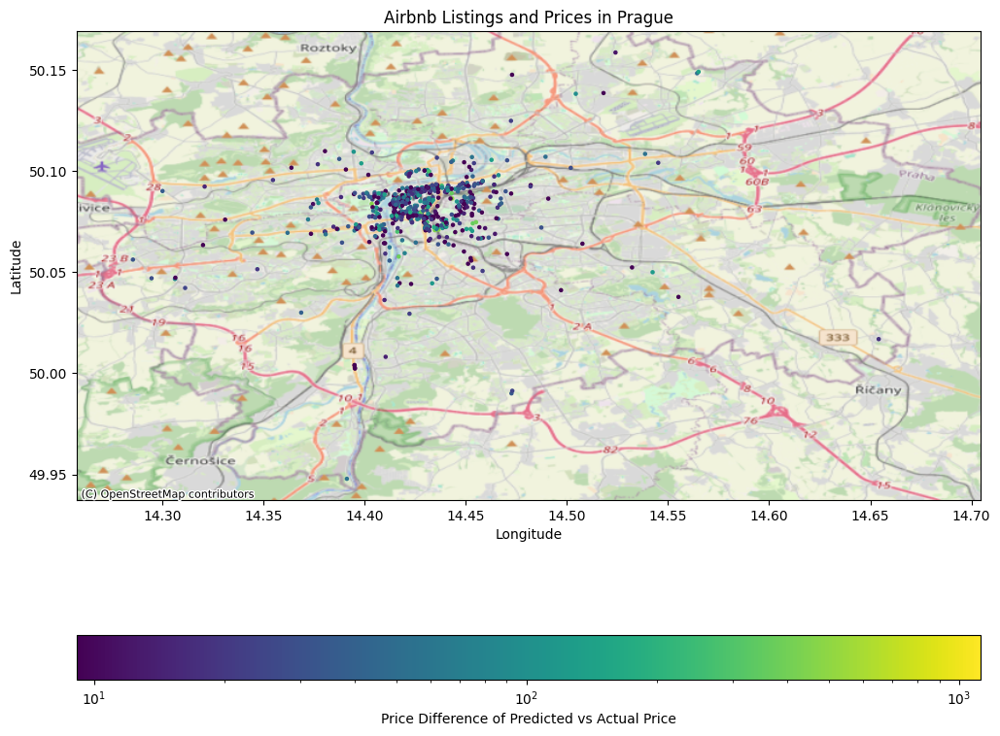

In [268]:
# Plot the Difference column with the basemap of Prague

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(12, 12))


# Plot Airbnb listings with a logarithmic colormap
gdf_val.plot(ax=ax, column='Difference', 
                legend=True, 
                legend_kwds={'label': "Price Difference of Predicted vs Actual Price", 'orientation': "horizontal"},
                markersize=5, 
                cmap='viridis', 
                norm=LogNorm(vmin=gdf_merged['price'].min(), vmax=gdf_merged['price'].max()))

# Add basemap using OpenStreetMap
cx.add_basemap(ax=ax, crs=gdf_merged.crs, source=cx.providers.OpenStreetMap.Mapnik)

# Set title and labels
plt.title('Airbnb Listings and Prices in Prague')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Save plot
plt.savefig('Grafiken/Predicted_vs_Actual_Price.png')

# Show plot
plt.show()

- Most of the predicted prices are very close to the actual prices, which is a good sign that the model is performing well. However, there are some outliers where the predicted prices are significantly higher or lower than the actual prices. 